 <font size="10">**Notebook 05: Intitial round of quality control (QC)**</font>
***

<div class="alert alert-info">
    
<b> <h1> ℹ️ <strong> <font size="6" color="black"> Important notebook information </font> </strong> </h1> </b>
    <hr>
    <font size="4" color="black">
        The purpose of this notebook is to remove low quality cells from the combined n=3 anndata object to be used for downstream preprocessing  <br> <br>
    This notebook will investigate low quality cells by looking at n_genes, n_counts and mitochondrial percentage but will only cut by n_genes and n_counts  <br> <br>
    Mitochondrial percentage will be applied at a later date once it is established that not a single celltype of interest will be removed as a result of a too harsh mitochondrial cutoff  <br> <br>
    To note: this notebook makes a lot of figure outputs, to reduce the number of outputs and save running time comment out saving line when and where appropriate for plots you don't want a separate copy of <br> <br>
    </font>

# Import packages

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import os
import sys
import datetime
import matplotlib as mpl
from matplotlib import cm
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
import seaborn as sns
from scipy.signal import find_peaks
import gc
import joypy
import math
from scipy import stats

import warnings
warnings.filterwarnings("ignore")

inline_rc = dict(mpl.rcParams)

#to set unique date for outputs
calc_date = datetime.datetime.now()
date=calc_date.strftime('%Y-%m-%d')
#date=calc_date.strftime('%d-%m-%Y')
date = date.replace('-', '')

sc.settings.verbosity = 2

# Note: package versions can be located in dependencies at the bottom of the script

# User interaction block

In [2]:
### User settings block ###

# Set root directory so all files and outputs can be found within one overarching location
root_directory = '/home/jovyan/mount_farm/nfs/team298/ar32/Whole_embryo/'

# set directory path to Whole_Embryo_utils.py: This python script hold modules / functions which are used within the script 
Whole_Embryo_utils_path = root_directory + "Utlis/"

# set directory path for the combined embryo anndata object from script 04
Comb_path = root_directory + 'Outputs/Objects/Raw_Objects/Combined_Embryos_all_suitable_lanes_raw_counts_20220425.h5ad'
data_name = 'Combined_Embryos_all_suitable_lanes_raw_counts_20220425'


# set directory path to save script outputs:
Objects_out_path = root_directory + 'Outputs/Objects/Post_QC/' # for anndata object
Metadata_out_path = root_directory + 'Outputs/Metadata/05_QC/' # for metadata


#############################################################################################################################


### Running checking directory paths to Whole_Embryo_utils.py and save directory paths ###

sys.path.append(Whole_Embryo_utils_path)
import Whole_Embryo_utils as eu

print('Checking file path for saving anndata objects:', "\n")
eu.save_path(Objects_out_path)
print("")
print('Checking file path for saving metadata:', "\n")
eu.save_path(Metadata_out_path)

Checking file path for saving anndata objects: 

File path provided exists
To save data to this location use the inputed variable at the start of the file path

Checking file path for saving metadata: 

File path provided exists
To save data to this location use the inputed variable at the start of the file path


# Load in data

In [3]:
# Load in anndata object
print('\033[1m' + f'Anndata object to load: {data_name}'+ '\033[0m')
adata = eu.load(Comb_path, Method='h5ad')
print('\033[1m' + 'Data loaded under variable: adata'+ '\033[0m')

Anndata object to load: Combined_Embryos_all_suitable_lanes_raw_counts_20220425
Beginning to load data:
Method chosen for loading is h5ad out of the options: h5ad , h5 or mtx

Data loaded in successfully
Overall shape: (1183081, 36601)
Min count: 0.0
Max count: 16057.0

Data loaded under variable: adata


# Run scrublet

In [4]:
# Calculate scrublet scores
eu.scrublet(adata, column='sequencing_lane_ID', single_cutoff = False, multi_cutoffs = [1.4826,2,3], save_path = Metadata_out_path, date = date)
print("")
doublet_columns = list(adata.obs.columns[adata.obs.columns.str.contains('doublet')])
doublet_summary = pd.DataFrame(index = ['True', 'False'])
doublet_summary.index.name='Doublets'
for col in doublet_columns:
    fc, tc = adata.obs[col].value_counts().sort_index().tolist()
    col_name = col.replace("_is_doublet", "")
    doublet_summary[col_name] = [tc, fc]
print('\033[1m' + 'Individual cell calling for potential doublets across multiple thresholds'+ '\033[0m')
display(doublet_summary)

Starting scrublet run
Multiple cutoffs selected, proceeding to cycle through different cutoffs inputted
Cutoff values inputted:
1.4826
2
3

Starting scrublet run for value 1.4826
The number of doublets using column sequencing_lane_ID at cutoff 1.4826:
Doublets: 203615
Not Doublets: 979466

Scrublet run using column sequencing_lane_ID at cutoff 1.4826 complete

Scrublet run finished


Starting scrublet run for value 2
The number of doublets using column sequencing_lane_ID at cutoff 2:
Doublets: 148947
Not Doublets: 1034134

Scrublet run using column sequencing_lane_ID at cutoff 2 complete

Scrublet run finished


Starting scrublet run for value 3
The number of doublets using column sequencing_lane_ID at cutoff 3:
Doublets: 89944
Not Doublets: 1093137

Scrublet run using column sequencing_lane_ID at cutoff 3 complete

Scrublet run finished



Individual cell calling for potential doublets across multiple thresholds


,cutoff_1.4826,cutoff_2,cutoff_3
Doublets,,,
True,203615,148947,89944
False,979466,1034134,1093137


## Perform initial calculations for dataset
- Calculate inital metadata information which will be useful

In [5]:
# Calculate the initial number of cells before any QC has been applied
cell_number_start = len(adata.obs)
#gene_number_start = len(adata.var)

#############################################################################################################################

# Perform scanpy QC metrics 
adata.obs['nUMI'] = adata.X.sum(axis=1)
sc.pp.calculate_qc_metrics(adata, var_type='genes', layer=None, use_raw=False, inplace=True, parallel=None)
adata.obs["nGene"] = adata.obs["n_genes_by_counts"]
adata.obs["nCounts"] = adata.obs["total_counts"]

#############################################################################################################################

# Remove scanpy QC metrics which will not be used to clear up .obs and .var
remove_list_obs = ["n_genes_by_counts","log1p_n_genes_by_counts","log1p_total_counts","total_counts","pct_counts_in_top_50_genes","pct_counts_in_top_100_genes","pct_counts_in_top_200_genes","pct_counts_in_top_500_genes"]
remove_list_var = ["n_cells_by_counts","mean_counts","log1p_mean_counts","pct_dropout_by_counts","total_counts","log1p_total_counts"]
for column in remove_list_obs: del adata.obs[column]
for column in remove_list_var: del adata.var[column]

#############################################################################################################################

# Add in metadata information for mitochondrial and ribosomal genes

mito_genes = adata.var_names.str.startswith('MT-')
ribo_genes = adata.var_names.str.startswith(tuple(['RPS','RPL']))
adata.obs['percent.mito'] = np.sum(adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
adata.obs['percent.ribo'] = np.sum(adata[:, ribo_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1


## Make classical scanpy QC plots:
- Produce plots people are familair with on whole data (n=3) before deeper checking

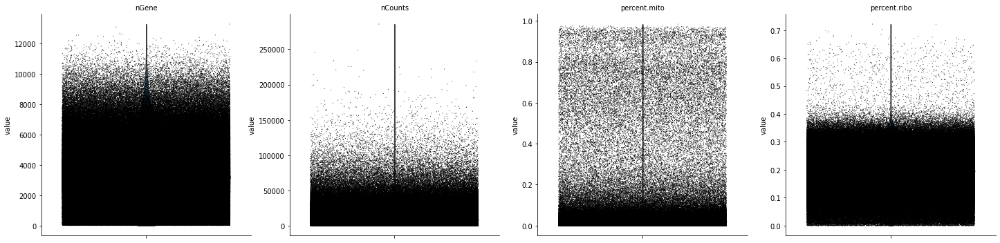

In [6]:
with plt.rc_context():  # Use this to set figure params like size and dpi
    sc.pl.violin(adata, ['nGene', 'nCounts', 'percent.mito', 'percent.ribo'], jitter=0.4, multi_panel=True, show=False)
    plt.savefig(Metadata_out_path+'05_QC_plot_01.pdf', bbox_inches="tight")

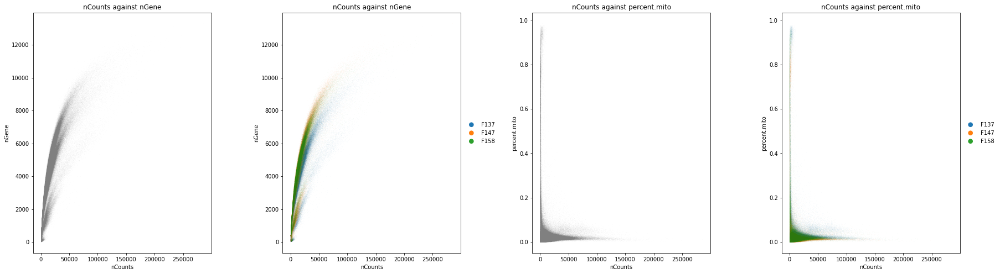

In [7]:
mpl.rcParams.update(inline_rc)
fig, ((ax1,ax2, ax3,ax4)) = plt.subplots(1,4, figsize=(30,8))

sc.pl.scatter(adata, x='nCounts', y='nGene', ax=ax1, show=False)
ax1.title.set_text('nCounts against nGene')
sc.pl.scatter(adata, x='nCounts', y='nGene', color='haniffa_ID', ax=ax2, show=False)
ax2.title.set_text('nCounts against nGene')
sc.pl.scatter(adata, x='nCounts', y='percent.mito', ax=ax3, show=False)
ax3.title.set_text('nCounts against percent.mito')
sc.pl.scatter(adata, x='nCounts', y='percent.mito', color='haniffa_ID', ax=ax4, show=False)
ax4.title.set_text('nCounts against percent.mito')
plt.subplots_adjust(wspace=0.4, hspace=0)
plt.show()
fig.savefig(Metadata_out_path+'05_QC_plot_02.pdf')

# Evaluate potential QC cutoffs
- QC cutoffs investigating for this data are: nGene, nCounts and percent.mito
- Since no annotations yet percent.mito will be removed at a later stage until it is determined not to remove a single annotation of interest

## Cutoffs nGene and nCounts across whole data and per individual sample
- Red line =  Potential cutoff value 1 (upper)
- Green line   =  Potential cutoff value 2 (lower)

### Violin plots to show distribution
- Proposed method scanpy uses to briefly visualise the distribution of the data
- Applying upper and lower cutoffs proposed to use as red and green respectively

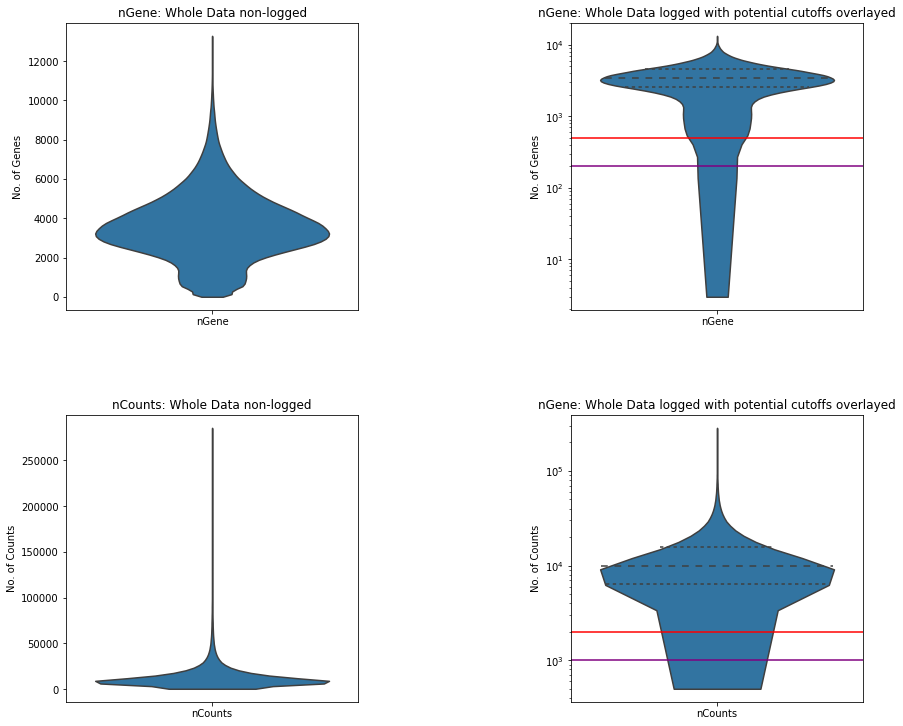

In [8]:
# Whole Data

mpl.rcParams.update(inline_rc)

fig = plt.figure(constrained_layout=True, figsize=(12,10))
# nGene
ax1 = plt.subplot(2,2,1)
sc.pl.violin(adata,['nGene'], stripplot=False ,log=False, show=False, ax=ax1);
plt.title('nGene: Whole Data non-logged')
plt.ylabel('No. of Genes')
ax2 = plt.subplot(2,2,2)
sc.pl.violin(adata,['nGene'], stripplot=False ,log=True, show=False, inner='quartile', ax=ax2);
plt.axhline(y = 200, color = 'purple', linestyle = '-') # default scanpy pipeline cutoff
plt.axhline(y = 500, color = 'r', linestyle = '-') # pan-fetal/thymus papers cutoff used
plt.title('nGene: Whole Data logged with potential cutoffs overlayed')
plt.ylabel('No. of Genes')

# nCounts
ax3 = plt.subplot(2,2,3)
sc.pl.violin(adata,['nCounts'], stripplot=False ,log=False, show=False, ax=ax3);
plt.title('nCounts: Whole Data non-logged')
plt.ylabel('No. of Counts')
ax4 = plt.subplot(2,2,4)
sc.pl.violin(adata,['nCounts'], stripplot=False ,log=True, show=False, inner='quartile', ax=ax4);
plt.axhline(y = 2000, color = 'r', linestyle = '-') 
plt.axhline(y = 1000, color = 'purple', linestyle = '-') 
plt.title('nGene: Whole Data logged with potential cutoffs overlayed')
plt.ylabel('No. of Counts')

fig.set_constrained_layout_pads(w_pad=4 / 72, h_pad=4 / 72, hspace=0.2, wspace=0.4)
plt.show()
fig.savefig(Metadata_out_path+'05_QC_plot_03.pdf', bbox_inches='tight')

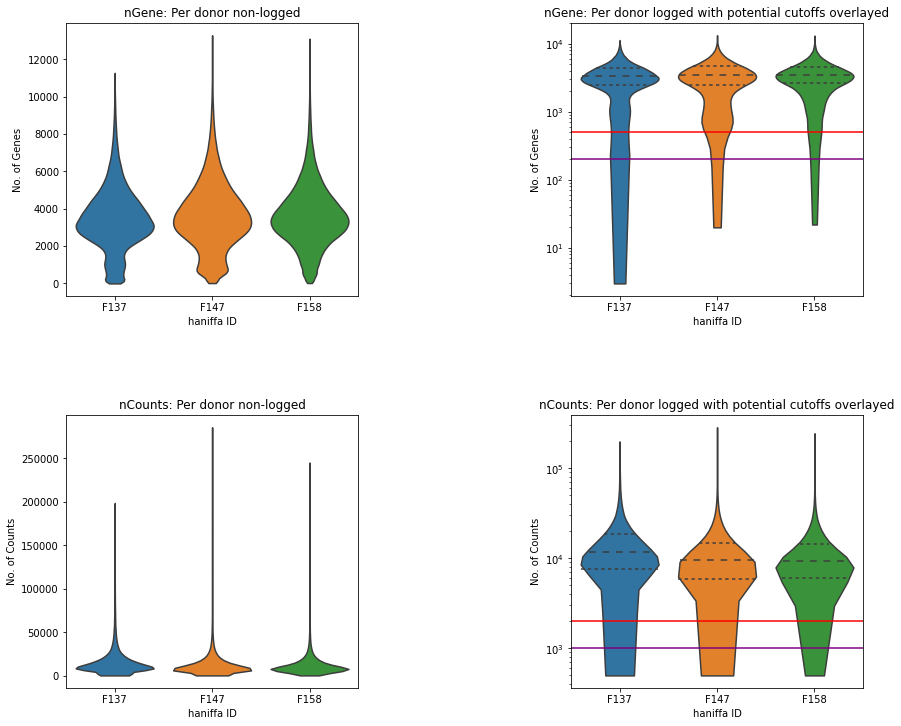

In [9]:
# Per individual sample (n=3)

mpl.rcParams.update(inline_rc)

fig = plt.figure(constrained_layout=True, figsize=(12,10))
# nGene
ax1 = plt.subplot(2,2,1)
sc.pl.violin(adata,['nGene'], stripplot=False ,log=False, show=False, ax=ax1, groupby='haniffa_ID');
plt.title('nGene: Per donor non-logged')
plt.ylabel('No. of Genes')
ax2 = plt.subplot(2,2,2)
sc.pl.violin(adata,['nGene'], stripplot=False ,log=True, show=False, inner='quartile', ax=ax2, groupby='haniffa_ID');
plt.axhline(y = 200, color = 'purple', linestyle = '-') # default scanpy pipeline cutoff
plt.axhline(y = 500, color = 'r', linestyle = '-') # pan-fetal/thymus papers cutoff used
plt.title('nGene: Per donor logged with potential cutoffs overlayed')
plt.ylabel('No. of Genes')

# nCounts
ax3 = plt.subplot(2,2,3)
sc.pl.violin(adata,['nCounts'], stripplot=False ,log=False, show=False, ax=ax3, groupby='haniffa_ID');
plt.title('nCounts: Per donor non-logged')
plt.ylabel('No. of Counts')
ax4 = plt.subplot(2,2,4)
sc.pl.violin(adata,['nCounts'], stripplot=False ,log=True, show=False, inner='quartile', ax=ax4, groupby='haniffa_ID');
plt.axhline(y = 2000, color = 'r', linestyle = '-') 
plt.axhline(y = 1000, color = 'purple', linestyle = '-') 
plt.title('nCounts: Per donor logged with potential cutoffs overlayed')
plt.ylabel('No. of Counts')

fig.set_constrained_layout_pads(w_pad=4 / 72, h_pad=4 / 72, hspace=0.2, wspace=0.4)
plt.show()
fig.savefig(Metadata_out_path+'05_QC_plot_04.pdf', bbox_inches='tight')

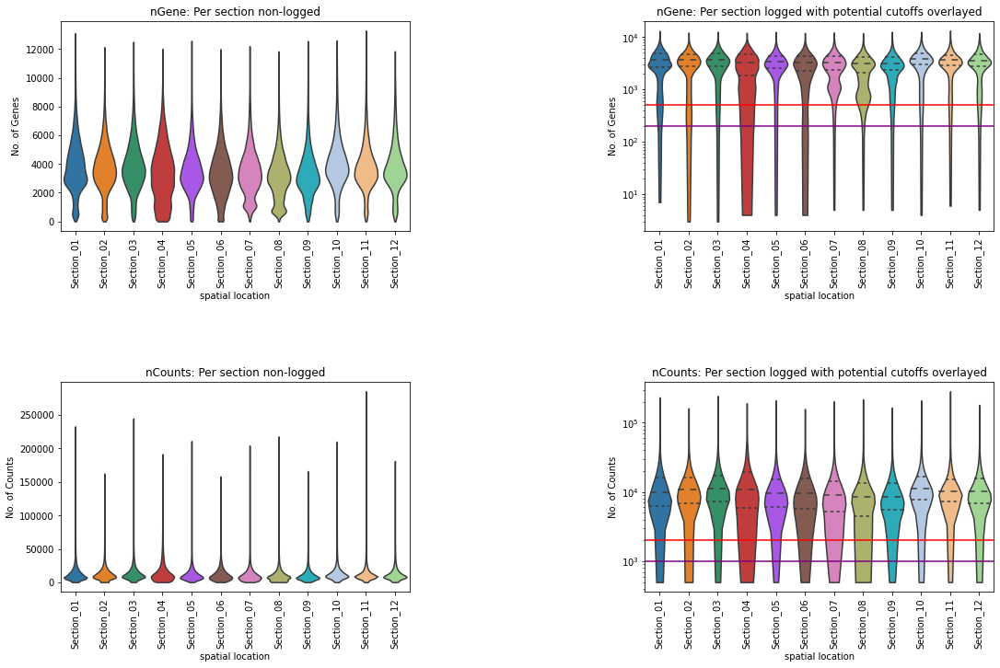

In [10]:
# Per individual sample (n=3)

mpl.rcParams.update(inline_rc)

fig = plt.figure(constrained_layout=True, figsize=(15,10))
# nGene
ax1 = plt.subplot(2,2,1)
sc.pl.violin(adata,['nGene'], stripplot=False ,log=False, show=False, ax=ax1, groupby='spatial_location');
plt.title('nGene: Per section non-logged')
plt.ylabel('No. of Genes')
plt.xticks(rotation=90)
ax2 = plt.subplot(2,2,2)
sc.pl.violin(adata,['nGene'], stripplot=False ,log=True, show=False, inner='quartile', ax=ax2, groupby='spatial_location');
plt.axhline(y = 200, color = 'purple', linestyle = '-') # default scanpy pipeline cutoff
plt.axhline(y = 500, color = 'r', linestyle = '-') # pan-fetal/thymus papers cutoff used
plt.title('nGene: Per section logged with potential cutoffs overlayed')
plt.ylabel('No. of Genes')
plt.xticks(rotation=90)

# nCounts
ax3 = plt.subplot(2,2,3)
sc.pl.violin(adata,['nCounts'], stripplot=False ,log=False, show=False, ax=ax3, groupby='spatial_location');
plt.title('nCounts: Per section non-logged')
plt.ylabel('No. of Counts')
plt.xticks(rotation=90)
ax4 = plt.subplot(2,2,4)
sc.pl.violin(adata,['nCounts'], stripplot=False ,log=True, show=False, inner='quartile', ax=ax4, groupby='spatial_location');
plt.axhline(y = 2000, color = 'r', linestyle = '-') 
plt.axhline(y = 1000, color = 'purple', linestyle = '-') 
plt.title('nCounts: Per section logged with potential cutoffs overlayed')
plt.ylabel('No. of Counts')
plt.xticks(rotation=90)

fig.set_constrained_layout_pads(w_pad=4 / 72, h_pad=4 / 72, hspace=0.2, wspace=0.4)
plt.show()
fig.savefig(Metadata_out_path+'05_QC_plot_05.pdf', bbox_inches='tight')

Trying to set attribute `.uns` of view, copying.


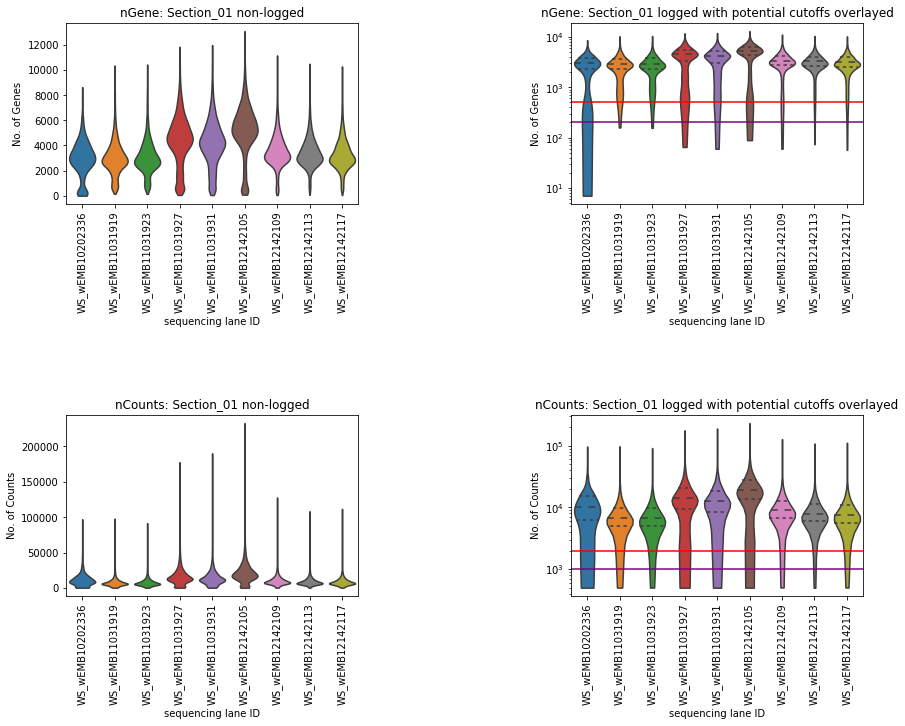

Trying to set attribute `.uns` of view, copying.


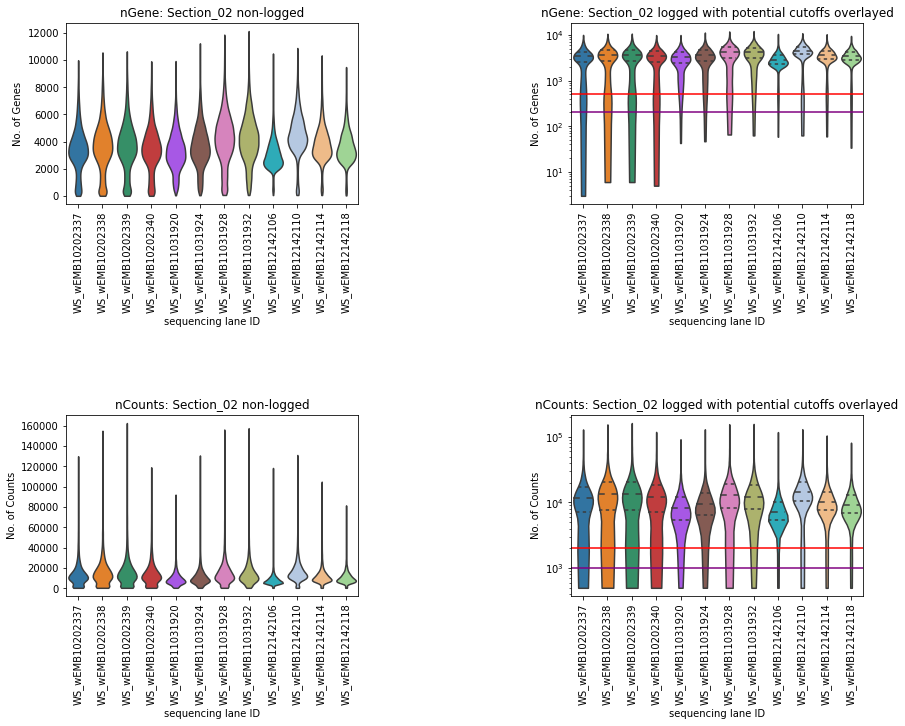

Trying to set attribute `.uns` of view, copying.


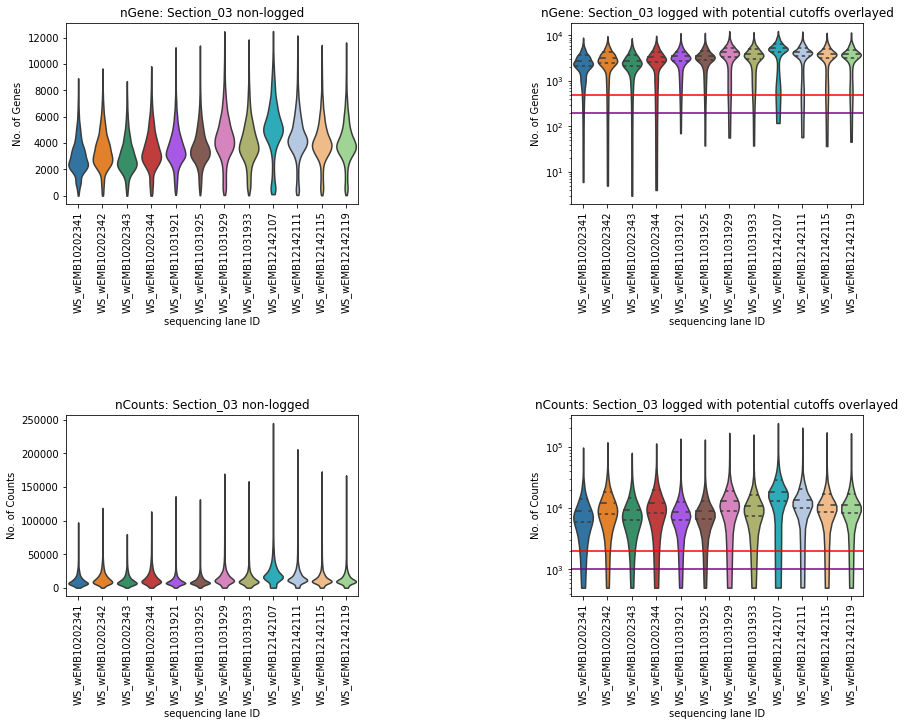

Trying to set attribute `.uns` of view, copying.


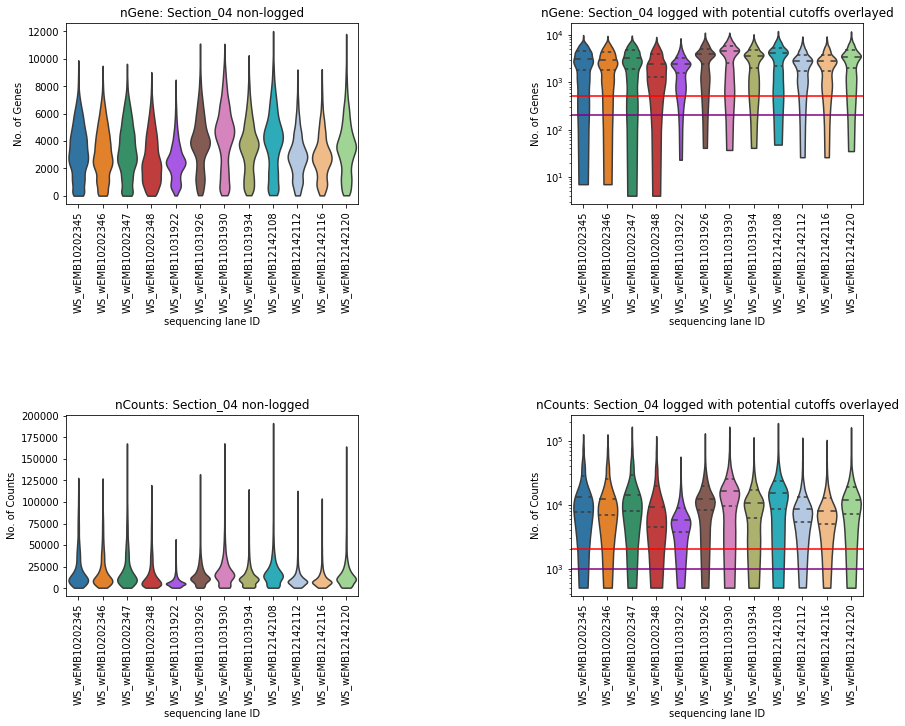

Trying to set attribute `.uns` of view, copying.


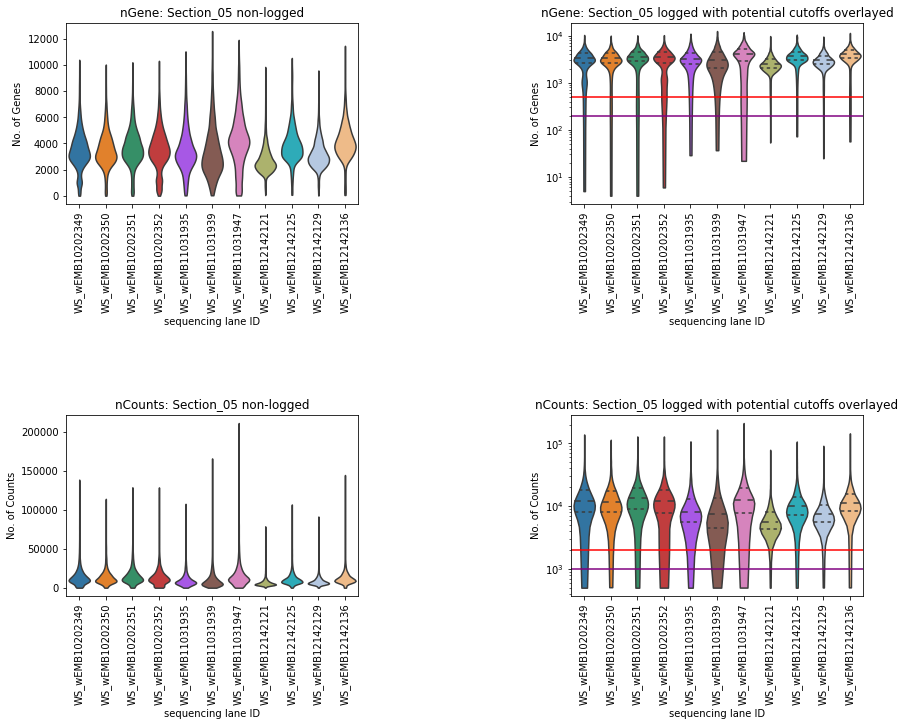

Trying to set attribute `.uns` of view, copying.


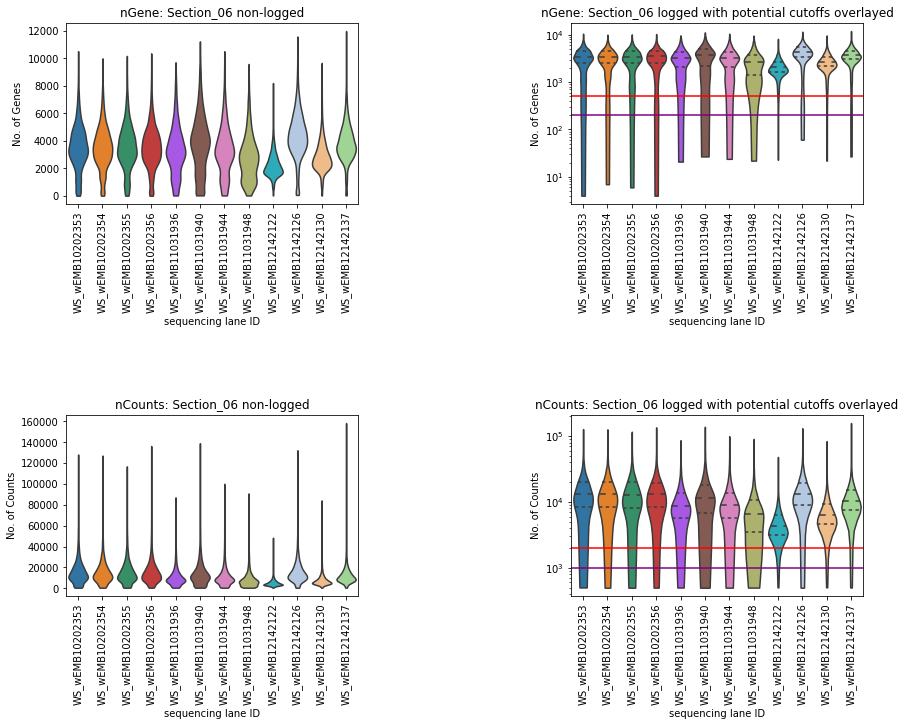

Trying to set attribute `.uns` of view, copying.


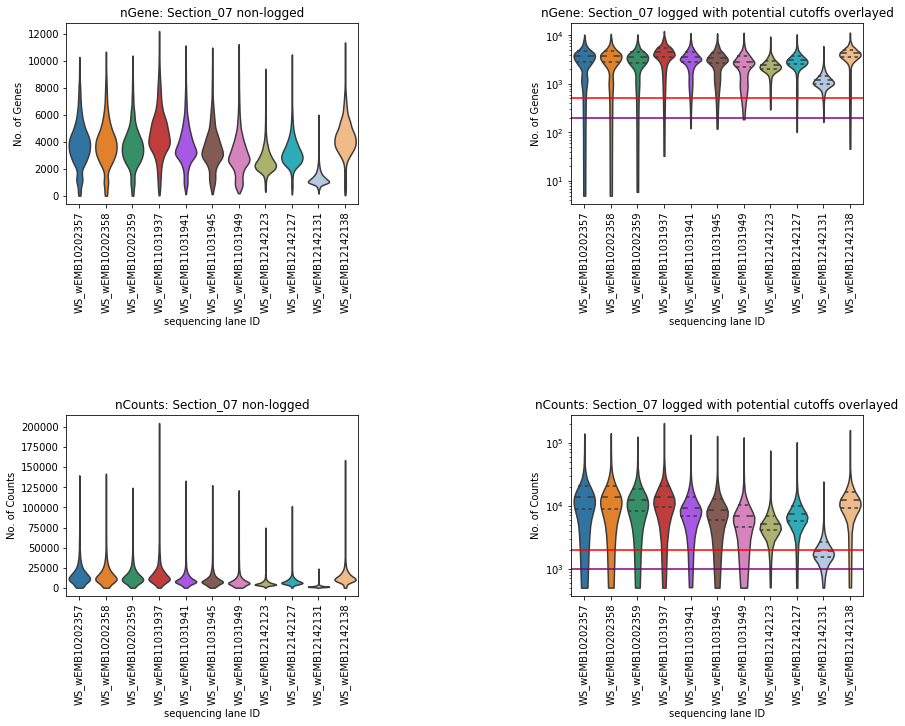

Trying to set attribute `.uns` of view, copying.


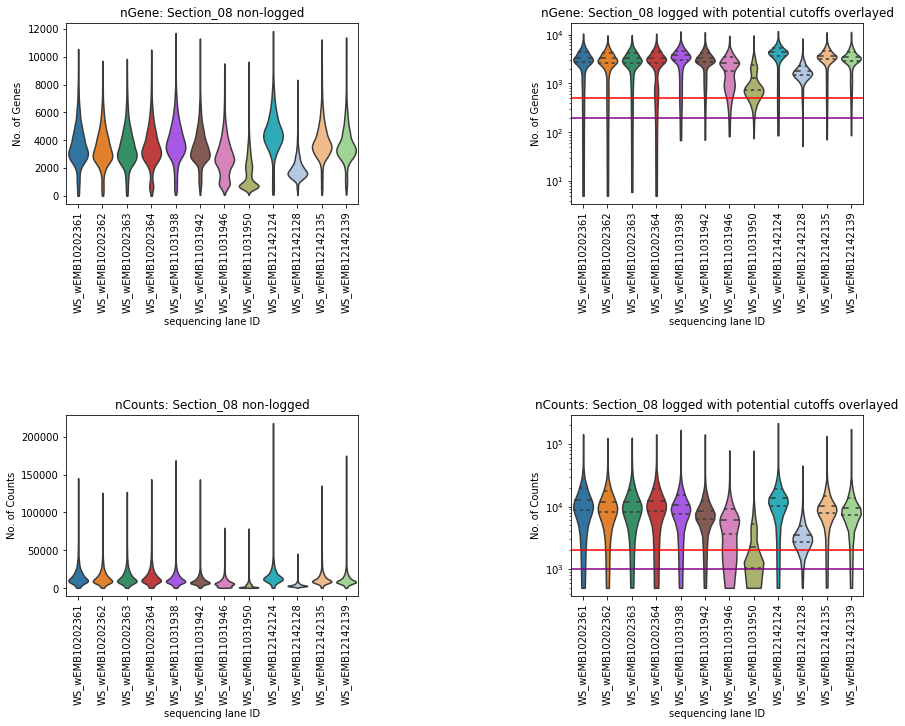

Trying to set attribute `.uns` of view, copying.


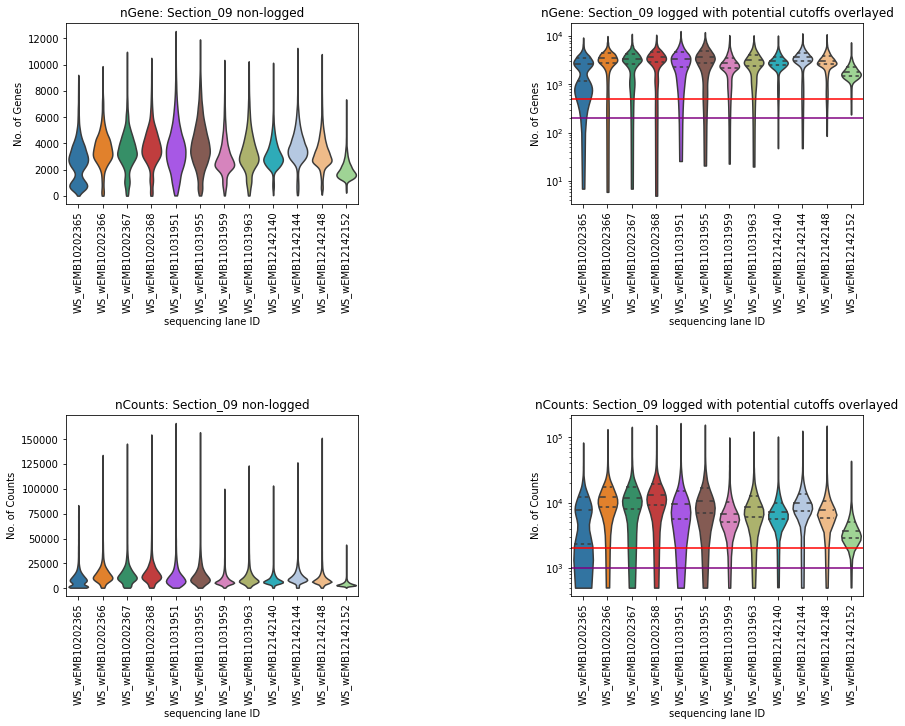

Trying to set attribute `.uns` of view, copying.


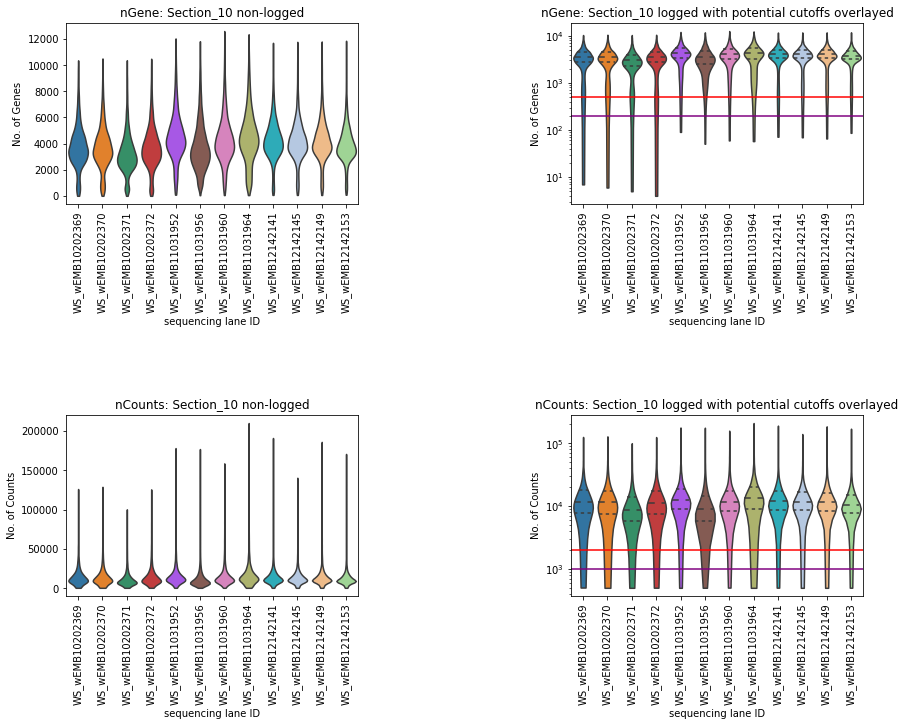

Trying to set attribute `.uns` of view, copying.


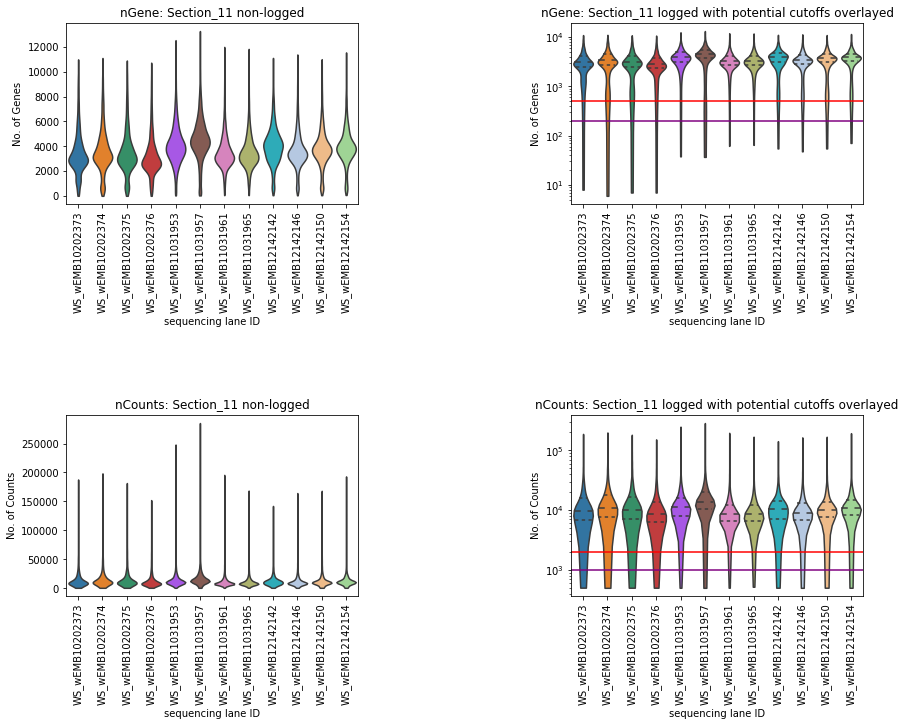

Trying to set attribute `.uns` of view, copying.


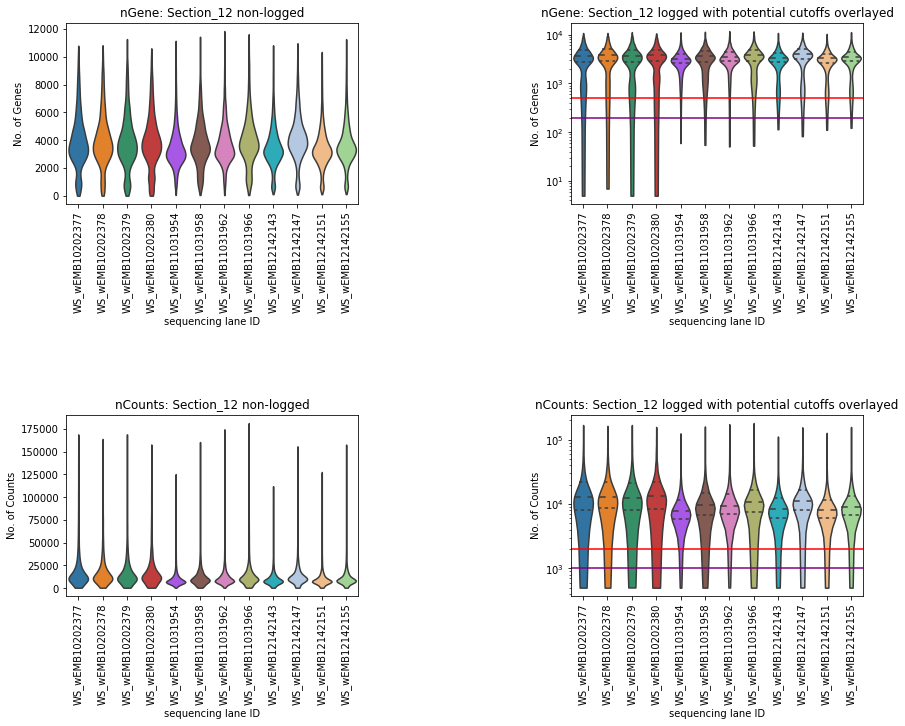

In [11]:
# Per individual lane

# as 103 lanes in total plotting in groups as too many for visualising together

numbers = ['06','07','08','09','10','11','12','13','14','15','16','17']

for n, s in enumerate(adata.obs['spatial_location'].unique()):

    df = adata[adata.obs['spatial_location'].isin([s])]
    
    mpl.rcParams.update(inline_rc)
    print("="*120)
    fig = plt.figure(constrained_layout=True, figsize=(12,10))
    # nGene
    ax1 = plt.subplot(2,2,1)
    sc.pl.violin(df,['nGene'], stripplot=False ,log=False, show=False, ax=ax1, groupby='sequencing_lane_ID');
    plt.title('nGene: {s} non-logged'.format(s=s))
    plt.ylabel('No. of Genes')
    plt.xticks(rotation=90)
    ax2 = plt.subplot(2,2,2)
    sc.pl.violin(df,['nGene'], stripplot=False ,log=True, show=False, inner='quartile', ax=ax2, groupby='sequencing_lane_ID');
    plt.axhline(y = 200, color = 'purple', linestyle = '-') # default scanpy pipeline cutoff
    plt.axhline(y = 500, color = 'r', linestyle = '-') # pan-fetal/thymus papers cutoff used
    plt.title('nGene: {s} logged with potential cutoffs overlayed'.format(s=s))
    plt.ylabel('No. of Genes')
    plt.xticks(rotation=90)
    
    # nCounts
    ax3 = plt.subplot(2,2,3)
    sc.pl.violin(df,['nCounts'], stripplot=False ,log=False, show=False, ax=ax3, groupby='sequencing_lane_ID');
    plt.title('nCounts: {s} non-logged'.format(s=s))
    plt.ylabel('No. of Counts')
    plt.xticks(rotation=90)
    ax4 = plt.subplot(2,2,4)
    sc.pl.violin(df,['nCounts'], stripplot=False ,log=True, show=False, inner='quartile', ax=ax4, groupby='sequencing_lane_ID');
    plt.axhline(y = 2000, color = 'r', linestyle = '-') 
    plt.axhline(y = 1000, color = 'purple', linestyle = '-') 
    plt.title('nCounts: {s} logged with potential cutoffs overlayed'.format(s=s))
    plt.ylabel('No. of Counts')
    plt.xticks(rotation=90)
    
    fig.set_constrained_layout_pads(w_pad=4 / 72, h_pad=4 / 72, hspace=0.2, wspace=0.4)
    plt.show()
    print("="*120)
    del df
    gc.collect()
    fig.savefig(Metadata_out_path+'05_QC_plot_'+numbers[n]+'.pdf', bbox_inches='tight')

### Violin outputs
- Violin plots suggest the both cutoffs are suitable for the data as a whole and across individual embryos being below the main bulk of the data

- The distibution for low quality cells due to low gene numbers mainly impacts Section_04 with some notable low quality in Sections 07 and 08

- Excluding lane WS_wEMB10202336 from golbal distributions evaluation observation which is noted to be a questional quality but is the only representation of embryo F137

### Histogram / KDE plots to show distribution more clearly for each cutoff category
- Violin plots useful to give a broad idea but harder to see the lower end of the data even when logged
- Single histogram / KDE plots gives us another view of the distribution of the data
- From the initial scatter plots there are distinct regions of outcrops which might suggest that both categories have different shapes of distribution
- Will also run simple peak detection to see roughly where the top most peak of the data is and if there is a lower peak respectively (upper and lower local maxima)

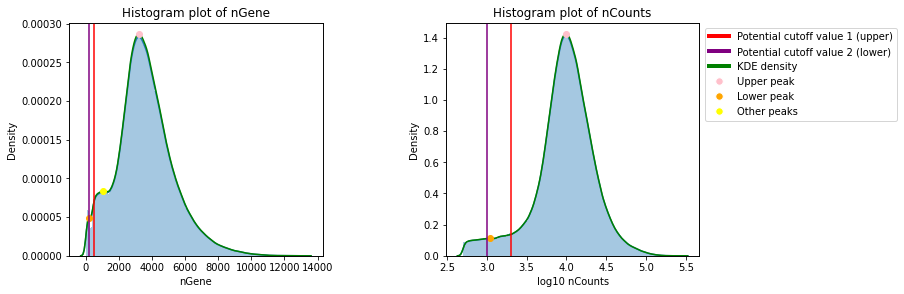

In [12]:
# Data as a whole

# Histograms
category1 = 'nGene'
category2 = 'nCounts'

x_axis_1 = adata.obs[category1]
x_axis_2 = np.log10(adata.obs[category2])

# determine bin number: Freedman-Diaconis rule - Used since visually works well for this data but it is not axiomatic
iqr_1 = (x_axis_1.quantile(0.75)) - (x_axis_1.quantile(0.25))
bin_width_1 = (2 * iqr_1) / (len(x_axis_1) ** (1 / 3))
bin_count_1 = int(np.ceil((x_axis_1.max() - x_axis_1.min()) / bin_width_1))


iqr_2 = (x_axis_2.quantile(0.75)) - (x_axis_2.quantile(0.25))
bin_width_2 = (2 * iqr_2) / (len(x_axis_2) ** (1 / 3))
bin_count_2 = int(np.ceil((x_axis_2.max() - x_axis_2.min()) / bin_width_2))


mpl.rcParams.update(inline_rc)
fig = plt.figure(constrained_layout=True, figsize=(12,4))

# Make a histogram of the data
ax1 = plt.subplot(1,2,1)
sns.distplot(x=x_axis_1,bins=bin_count_1, ax=ax1, color = "#1f77b4")
plt.xlabel(f'{category1}')

# Use a non-parametric technique to calculate the probaility distribution (the probability of density) of the continuous variable: KDE plot 
ax2 = ax1.twinx()
# Use a guassian kernel
sns.kdeplot(x_axis_1, color='green', kernel = 'gau', ax=ax2)

# Estimate modes of kde plot (looking for positive peaks)
x_1 = ax2.lines[0].get_xdata()
y_1 = ax2.lines[0].get_ydata()
min_height_1 = y_1.max()/20
peaks_1, _ = find_peaks(y_1, height = min_height_1)
top_peak_1 = np.argmax(y_1)
low_peak_1 = np.min(peaks_1)
other_peaks_1 = np.setdiff1d(peaks_1,np.array([low_peak_1,top_peak_1]))

# check if lowest and highest peaks are the same
if low_peak_1 == top_peak_1:
    plt.plot(x_1[top_peak_1], y_1[top_peak_1], 'o', ms=6, color='pink')
    print(f'Note the lowest peak is the same as the highest peak for category {category1} so only plotting upper peak')
else:
    plt.plot(x_1[top_peak_1], y_1[top_peak_1], 'o', ms=6, color='pink')
    plt.plot(x_1[low_peak_1], y_1[low_peak_1], 'o', ms=6, color='orange')
    plt.plot(x_1[other_peaks_1], y_1[other_peaks_1], 'o', ms=6, color='yellow')

plt.title(f'Histogram plot of {category1}')
val1_1 = 200
val2_1 = 500
plt.axvline(x = val1_1, color = 'purple', linestyle = '-')
plt.axvline(x = val2_1, color = 'r', linestyle = '-')
ax2.axes.yaxis.set_ticklabels([])
ax2.tick_params(right=False)
ax2.set(ylabel=None)

# Make a histogram of the data
ax3 = plt.subplot(1,2,2)
sns.distplot(x=x_axis_2,bins=bin_count_2, ax=ax3, color = "#1f77b4")
plt.xlabel(f'log10 {category2}')

# Use a non-parametric technique to calculate the probaility distribution (the probability of density) of the continuous variable: KDE plot 
ax4 = ax3.twinx()
# Use a guassian kernel
sns.kdeplot(x_axis_2, color='green', kernel = 'gau',ax=ax4)

# Estimate modes of kde plot (looking for positive peaks)
x_2= ax4.lines[0].get_xdata()
y_2 = ax4.lines[0].get_ydata()
min_height_2 = y_2.max()/20
peaks_2, _ = find_peaks(y_2, height = min_height_2)
top_peak_2 = np.argmax(y_2)
low_peak_2 = np.min(peaks_2)
other_peaks_2 = np.setdiff1d(peaks_2,np.array([low_peak_2,top_peak_2]))

# check if lowest and highest peaks are the same
if low_peak_2 == top_peak_2:
    plt.plot(x_2[top_peak_2], y_2[top_peak_2], 'o', ms=6, color='pink')
    print(f'Note the lowest peak is the same as the highest peak for category {category2} so only plotting upper peak')
else:
    plt.plot(x_2[top_peak_2], y_2[top_peak_2], 'o', ms=6, color='pink')
    plt.plot(x_2[low_peak_2], y_2[low_peak_2], 'o', ms=6, color='orange')
    plt.plot(x_2[other_peaks_2], y_2[other_peaks_2], 'o', ms=6, color='yellow')
    
plt.title(f'Histogram plot of {category2}')
val1_2 = 2000
val2_2 = 1000
plt.axvline(x = np.log10(val1_2), color = 'r', linestyle = '-') 
plt.axvline(x = np.log10(val2_2), color = 'purple', linestyle = '-')
ax4.axes.yaxis.set_ticklabels([])
ax4.tick_params(right=False)
ax4.set(ylabel=None)

legend_elements = [Line2D([0], [0], color='red', lw=4, label='Potential cutoff value 1 (upper)'),
                   Line2D([0], [0], color='purple', lw=4, label='Potential cutoff value 2 (lower)'),
                   Line2D([0], [0], color='green', lw=4, label='KDE density'),
                   Line2D([0], [0], marker='o', color='w', label='Upper peak', markerfacecolor='pink', markersize=15),
                   Line2D([0], [0], marker='o', color='w', label='Lower peak', markerfacecolor='orange', markersize=15),
                   Line2D([0], [0], marker='o', color='w', label='Other peaks', markerfacecolor='yellow', markersize=15)]


fig.set_constrained_layout_pads(w_pad=4 / 72, h_pad=4 / 72, hspace=0, wspace=0.2)
plt.legend(handles=legend_elements, markerscale=0.5,  bbox_to_anchor=[1.8, 1], loc='upper right')

plt.show()
fig.savefig(Metadata_out_path+'05_QC_plot_18.pdf', bbox_inches='tight')

- Histograms show both categories indeed have different shapes of distribution with nGene being more distinctly bimodal whereas nCounts only has 1 main mode
- Histogram of nCounts show there is a very small 2nd mode in the lower counts of the data which may contain important information

### Quick looks by donors, sections, lanes using ridgeplots
- Ridgeplots are useful for quick distibution comparions 

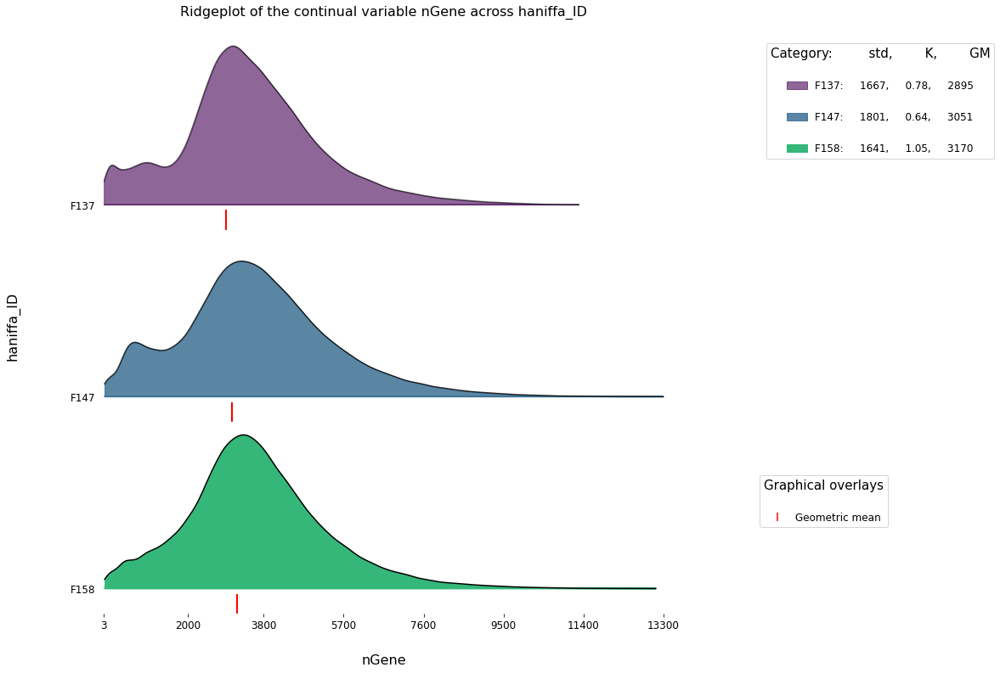

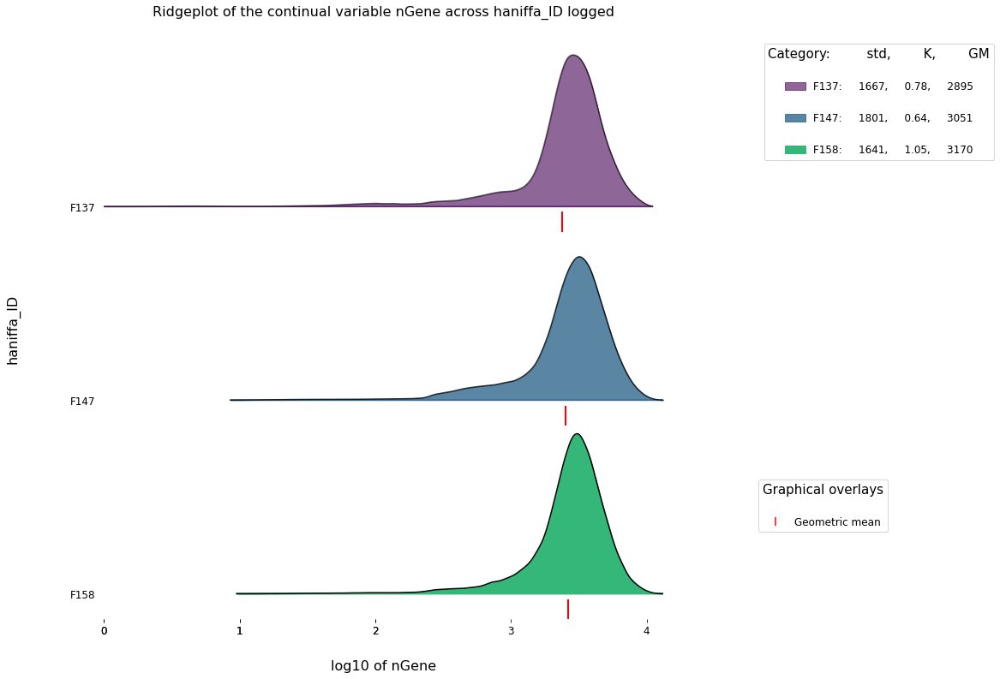

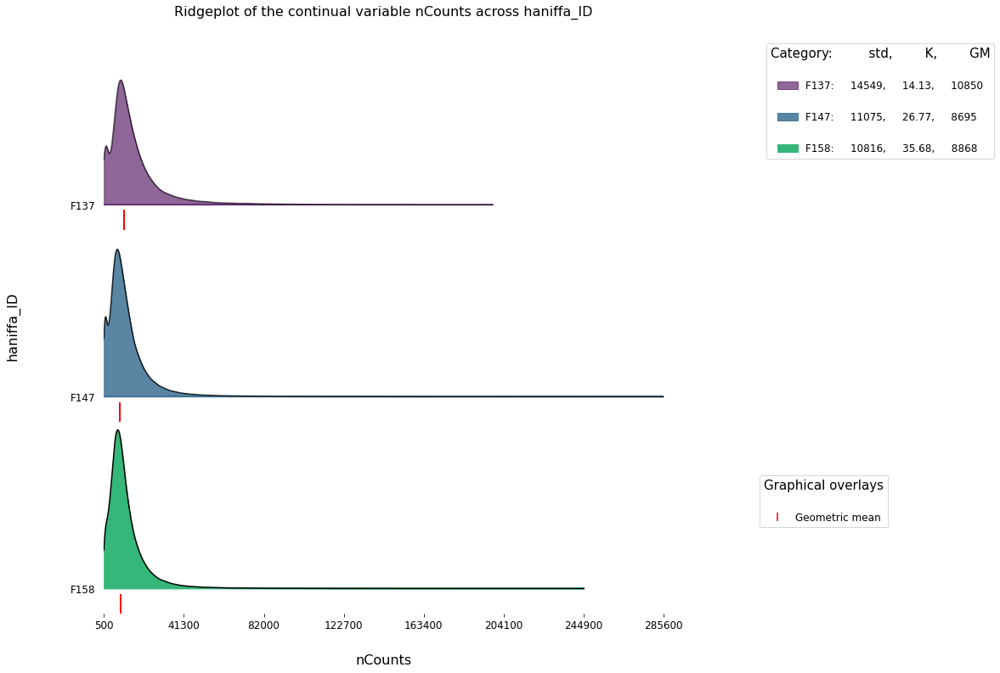

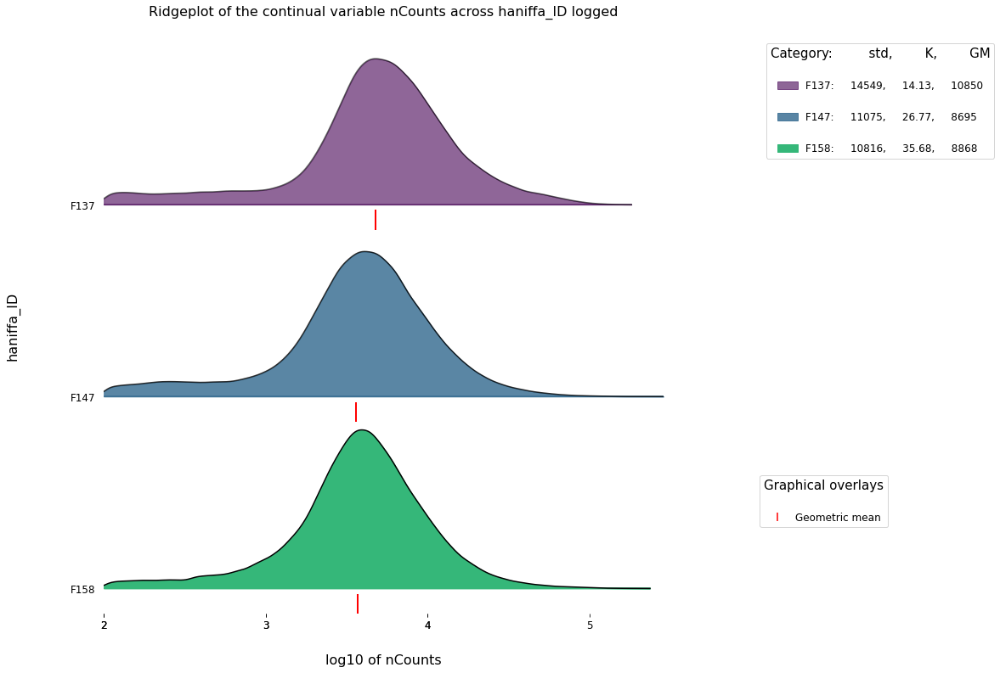

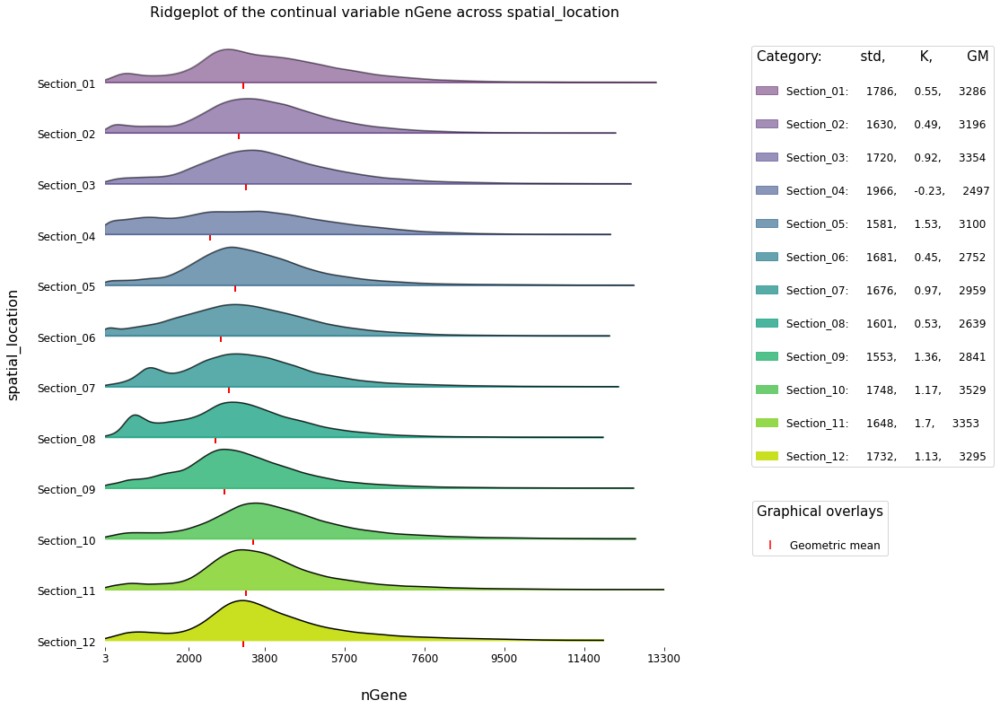

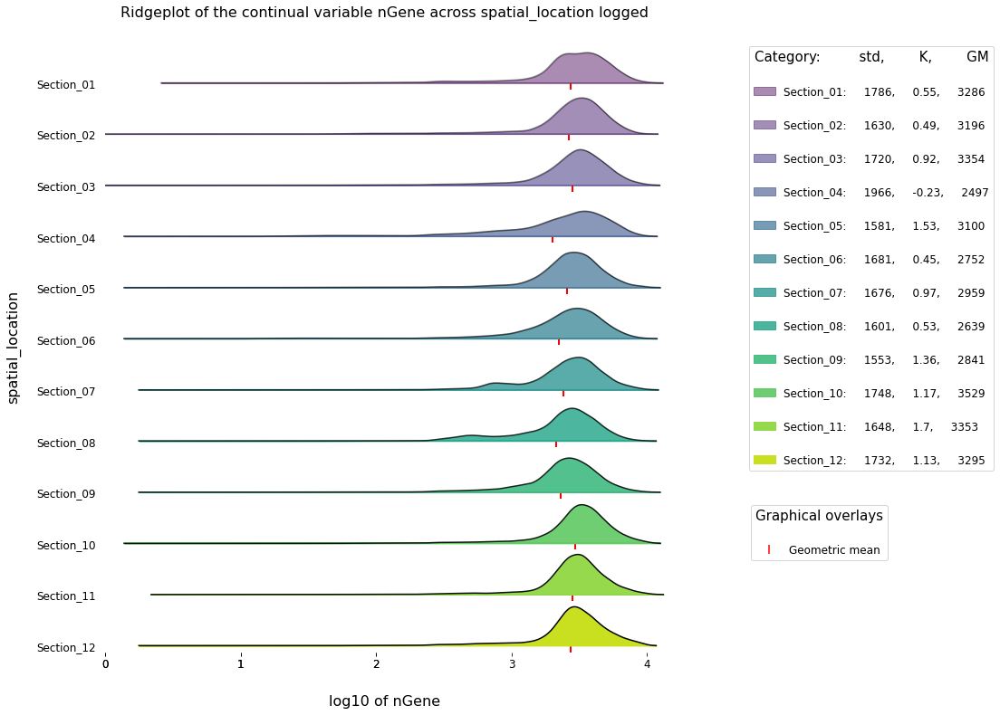

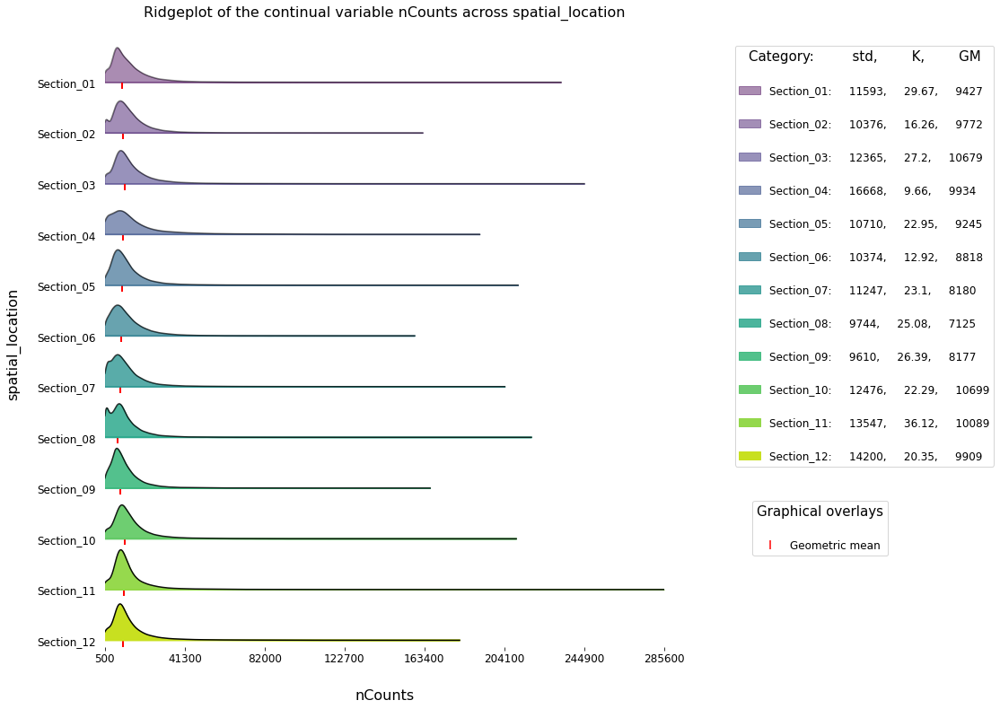

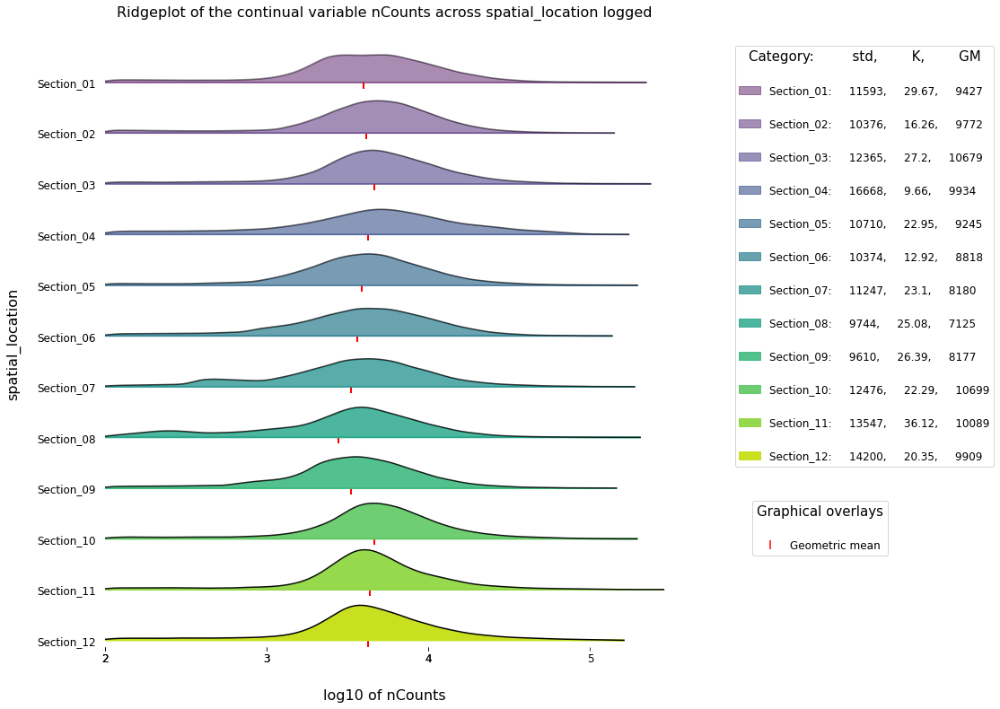

In [13]:
plots_df = pd.DataFrame(columns=['cat1','cat2','scale_log','tick_no'])

# Add what options you want to visualise
plots_df.loc[0] = ['haniffa_ID','nGene',False,8]
plots_df.loc[1] = ['haniffa_ID','nGene',True,8]
plots_df.loc[2] = ['haniffa_ID','nCounts',False,8]
plots_df.loc[3] = ['haniffa_ID','nCounts',True,8]
plots_df.loc[4] = ['spatial_location','nGene',False,8]
plots_df.loc[5] = ['spatial_location','nGene',True,8]
plots_df.loc[6] = ['spatial_location','nCounts',False,8]
plots_df.loc[7] = ['spatial_location','nCounts',True,8]


numbers = ['19','20','21','22','23','24','25','26']

# Make ridgeplots

for n, row in enumerate(plots_df.index):
    
    cat1 = plots_df.iloc[row]['cat1']
    cat2 = plots_df.iloc[row]['cat2']
    scale_log = plots_df.iloc[row]['scale_log']
    cmap = plt.cm.viridis
    tick_no = plots_df.iloc[row]['tick_no']
    
    print('='*120)   
    if scale_log == True:
        adata.obs['log_scaled_col'] = np.log10(adata.obs[cat2])
        cat_use = 'log_scaled_col'
    else:
        cat_use = cat2
    
    x_lim_range = [adata.obs[[cat_use,cat1]][cat_use].min(),adata.obs[[cat_use,cat1]][cat_use].max()]
    
    array = []
    ticks = np.linspace(int(x_lim_range[0]), int(x_lim_range[1]), num=tick_no, dtype=int)
    array.append(ticks[0])
        
    if scale_log == True:
        for i in ticks[1:]:
            array.append(math.ceil(i))
    else:
        for i in ticks[1:]:
            array.append(math.ceil(i / 100) *100)
    
    fig, axes = joypy.joyplot(data=adata.obs[[cat_use,cat1]], by=cat1, colormap=cmap, fade = True, range_style='group', x_range=x_lim_range, tails=0, xlim='max',  figsize = (10,10), overlap = 0, ylabelsize=12, xlabelsize=12) 
    
    axes[-1].set_xticks(array)
    if scale_log == True:
        plt.title(f'Ridgeplot of the continual variable {cat2} across {cat1} logged', fontsize=16, y=1.03)
        axes[-1].set_xlabel(f'log10 of {cat2}', fontsize=16, color='black', alpha=1)
    else:
        plt.title(f'Ridgeplot of the continual variable {cat2} across {cat1}', fontsize=16, y=1.03)
        axes[-1].set_xlabel(cat2, fontsize=16, color='black', alpha=1)
    axes[-1].xaxis.set_label_coords(0.5,-0.07)
    
    axes[-1].yaxis.set_visible(True)
    axes[-1].set_yticks([])
    axes[-1].set_ylabel(cat1, fontsize=16, color='black', alpha=1)
    axes[-1].yaxis.set_label_coords(-0.15,0.5)
    
    patches = [[]] * (len(axes)-1) 
    counter=0
    for i in axes:
        if counter > (len(patches) -1):
            break
        current_handles, current_labels = axes[counter].get_legend_handles_labels()
        patches[counter] = ((current_handles[0].get_edgecolor()).tolist()[0])
        counter+=1
    
    
    counter = 0
    labels = list(adata.obs[cat1].unique())
    lengend_patches = []
    
    gmeans = []
    for i in patches:
        std_ = int(adata.obs[adata.obs[cat1].isin([labels[counter]])][cat2].std())
        kur_ = round(stats.kurtosis(adata.obs[adata.obs[cat1].isin([labels[counter]])][cat2]), 2)
        gmean_ = int(stats.gmean(adata.obs[adata.obs[cat1].isin([labels[counter]])][cat2]))
        gmeans.append(gmean_)
        lengend_patches.append(mpatches.Patch(color=i, label=r'{a}:     {b},     {c},     {d}'.format(a=labels[counter], b=std_, c=kur_, d=gmean_))) #'
        counter+=1
    
        
    legend1 = plt.legend(handles=lengend_patches, title='Category:         std,        K,        GM', bbox_to_anchor=(1.6, 1), labelspacing = 2, fontsize=12, title_fontsize=15)
    #plt.setp(legend.get_title(), color='red')
    
    counter=0
    for i in patches:
        if scale_log == True:
            X = np.log10(gmeans[counter])
        else:
            X = gmeans[counter]
        axes[counter].axvline(X, color='red', lw=2, alpha=1, ymax=0.1)
        
        #if counter == (len(patches)-1):
        #    plt.text(x=gmeans[counter] - (gmeans[counter])/4, y=-0.05, s='Geometric mean', alpha=1, fontdict = {'color': 'r', 'fontsize' : '14'}) #axes[counter]
            
        counter+=1
    
    
    # 2nd legend
    
    line1 = Line2D([], [], color='red', marker='|', linestyle='None',
                              markersize=10, markeredgewidth=1.5, label='Geometric mean')
    
    legend2 = plt.legend(handles=[line1], title='Graphical overlays', bbox_to_anchor=(1.41, 0.25), labelspacing = 2, fontsize=12, title_fontsize=15)
    
    plt.gca().add_artist(legend1)
    plt.savefig(Metadata_out_path+'05_QC_plot_'+ numbers[n] +'.pdf', bbox_inches="tight")
    plt.show()
    print('='*120)

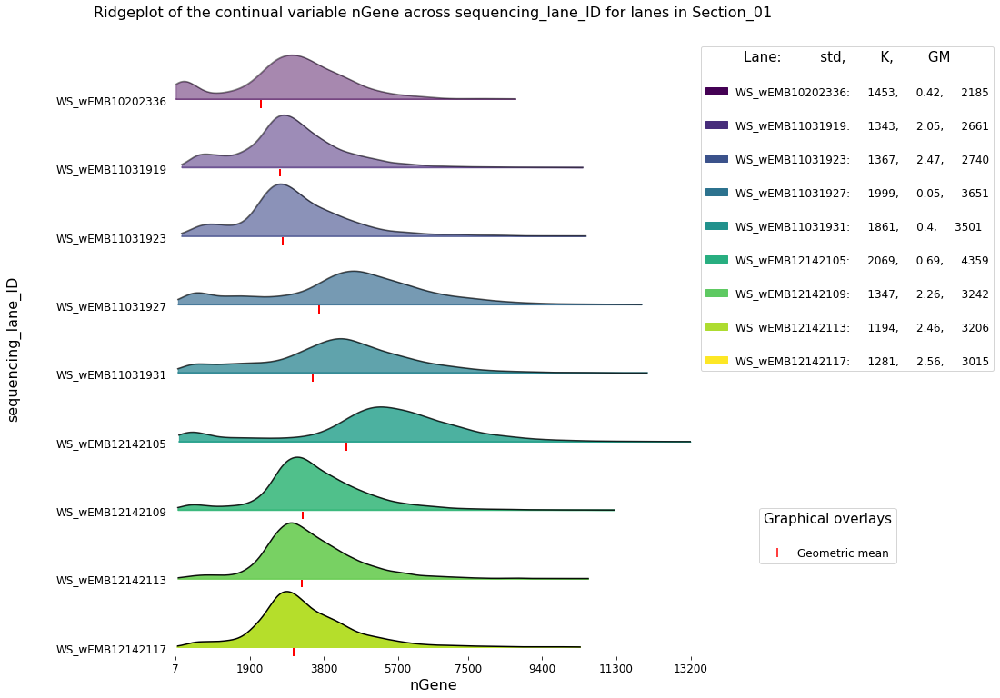

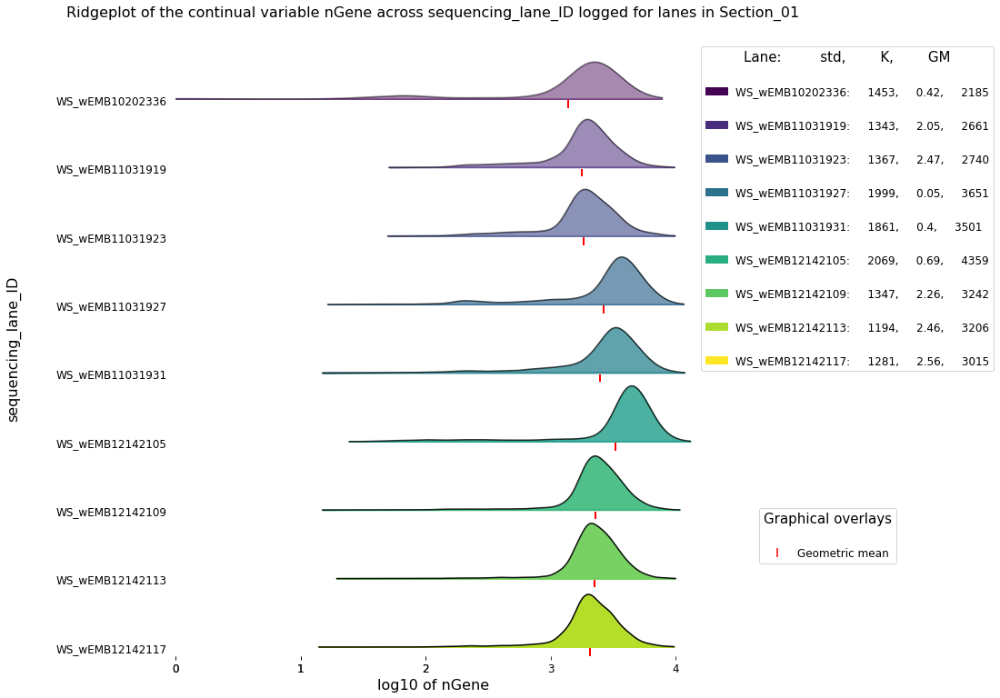

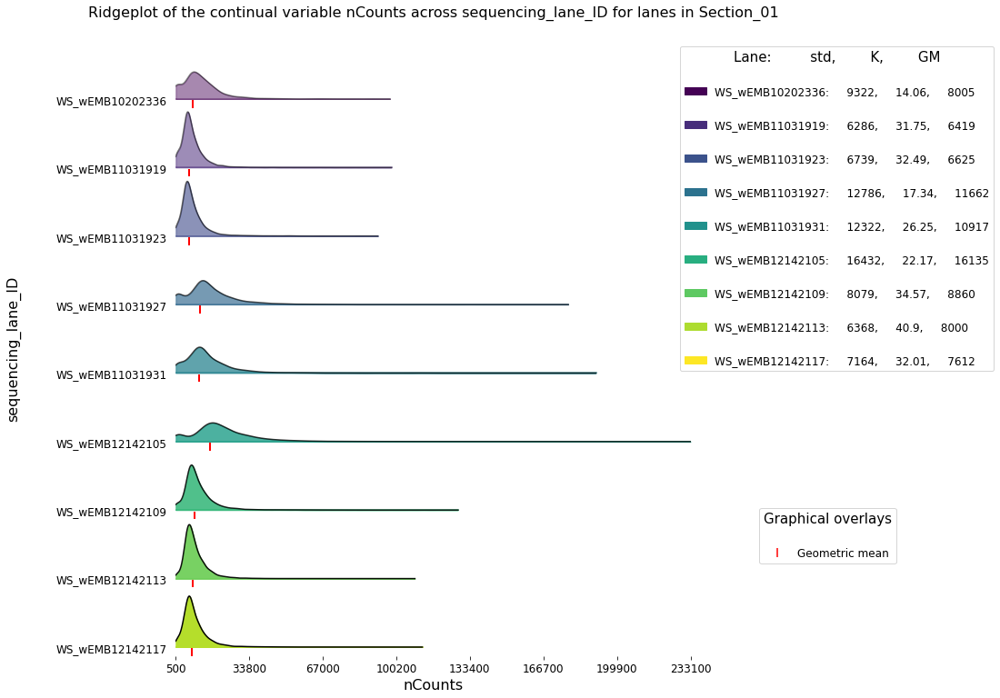

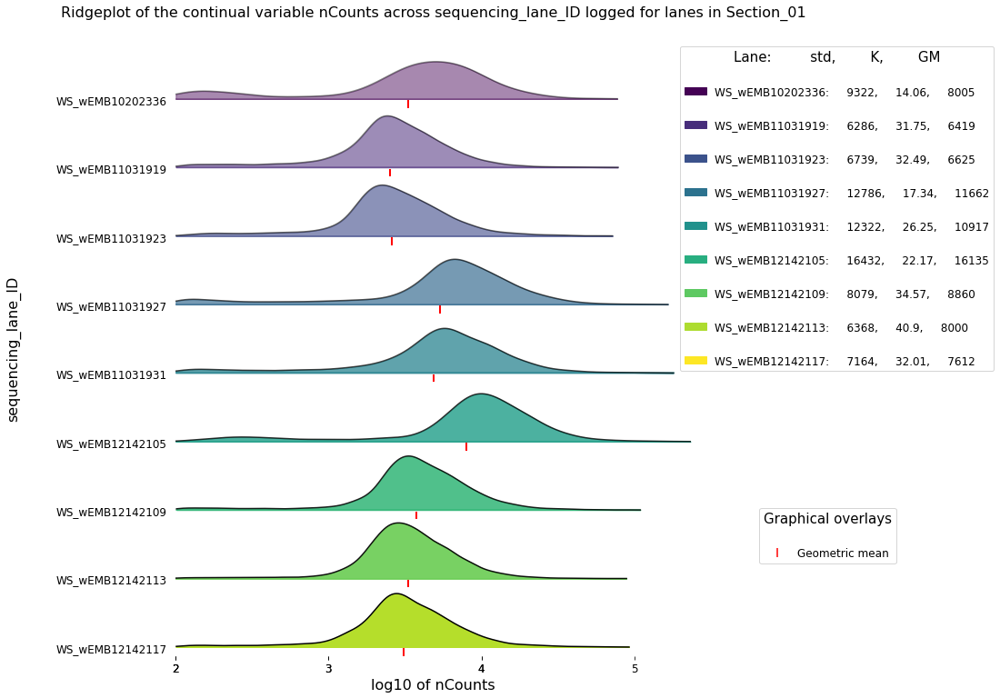

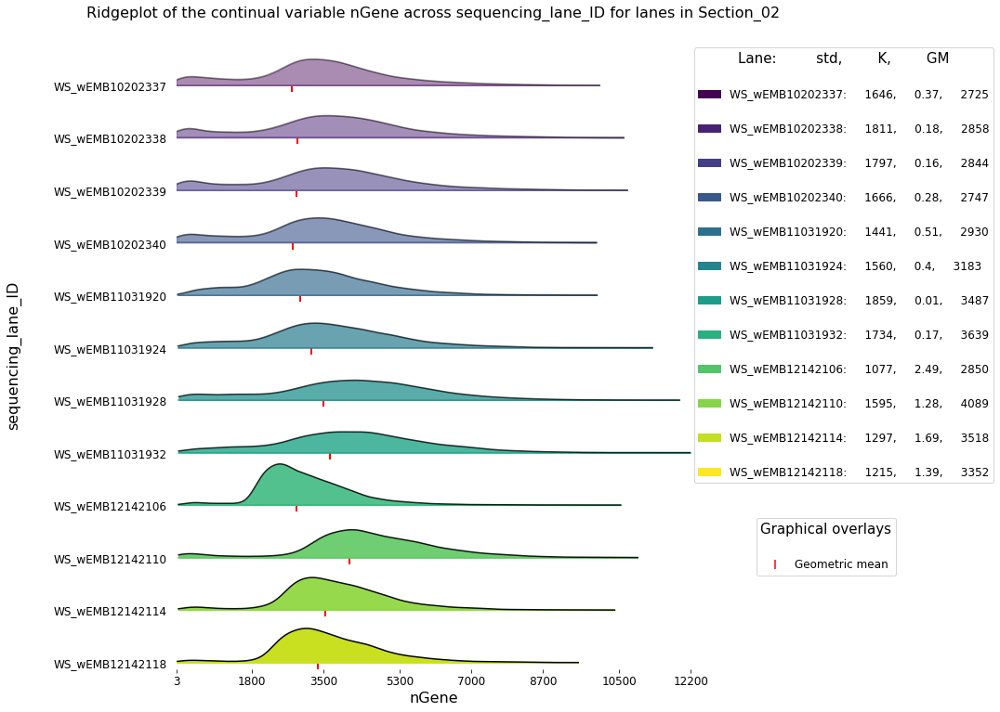

...

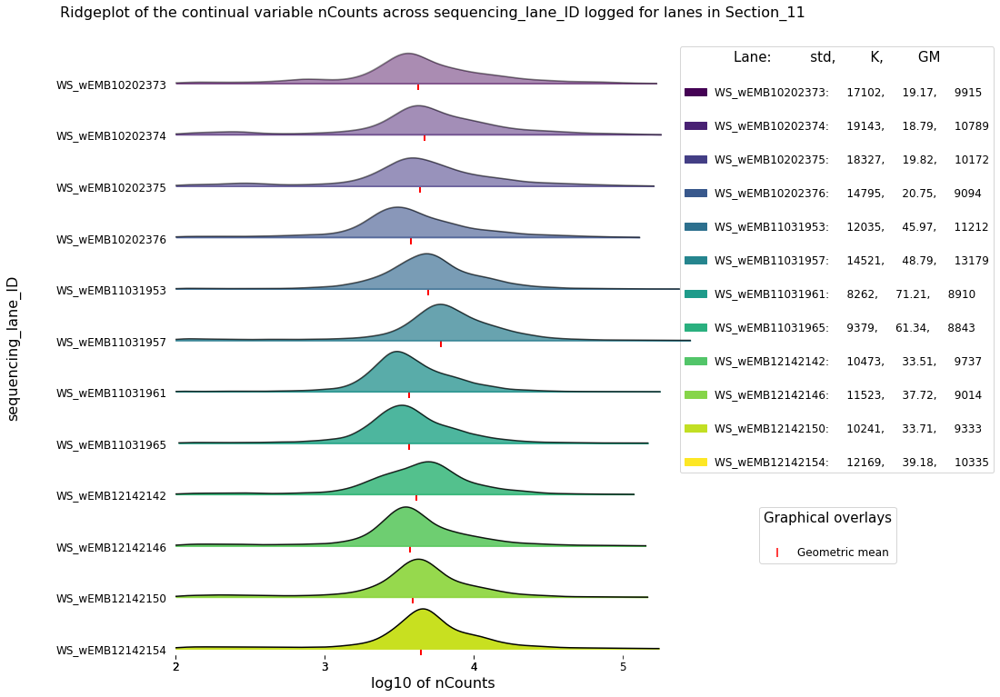

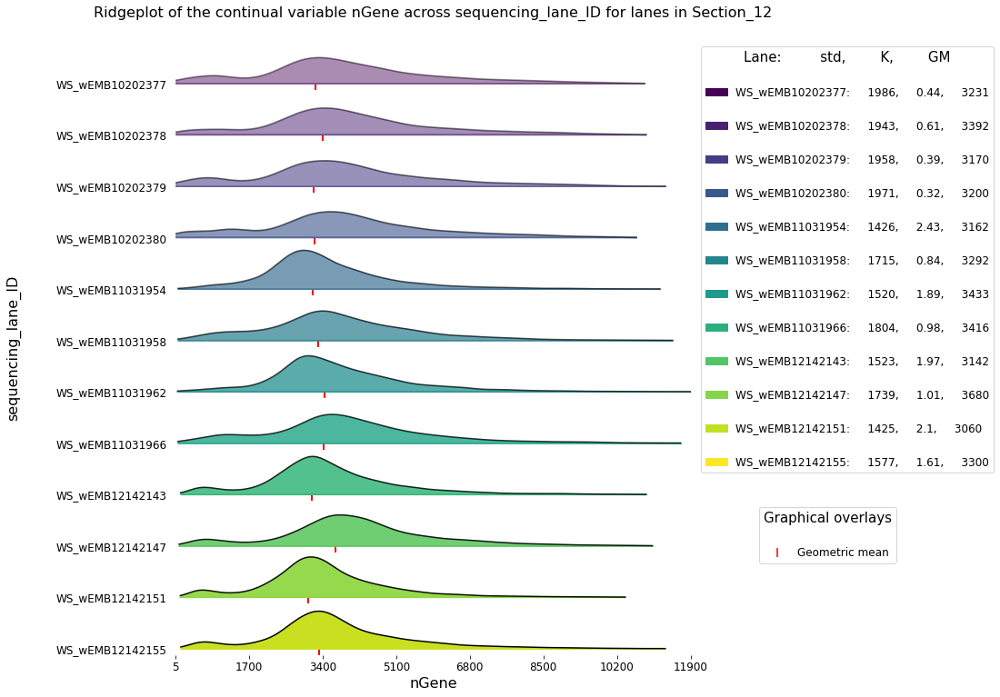

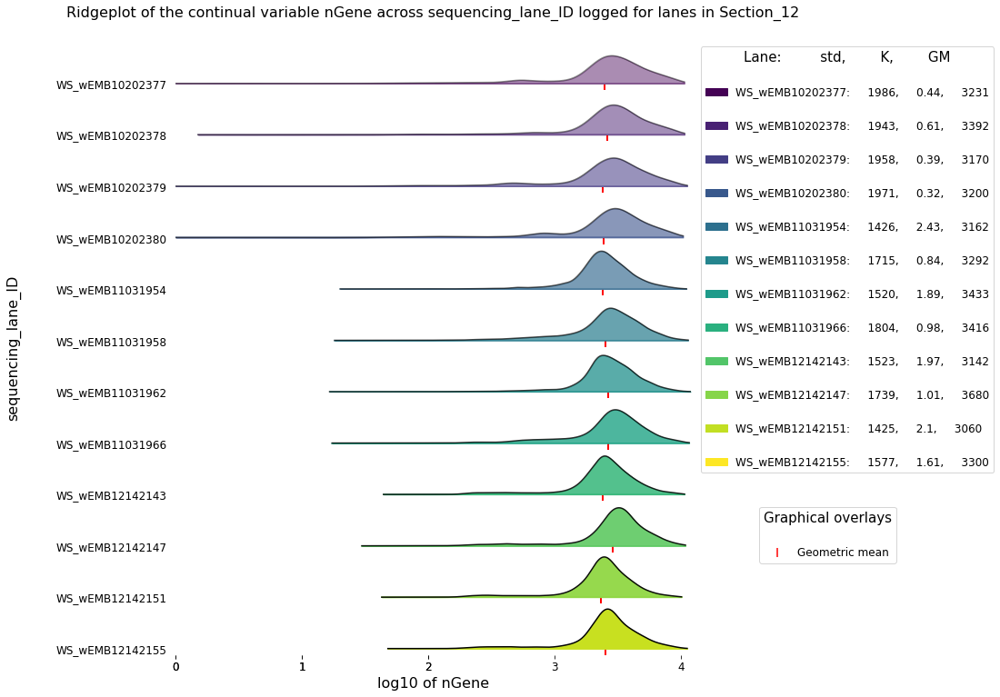

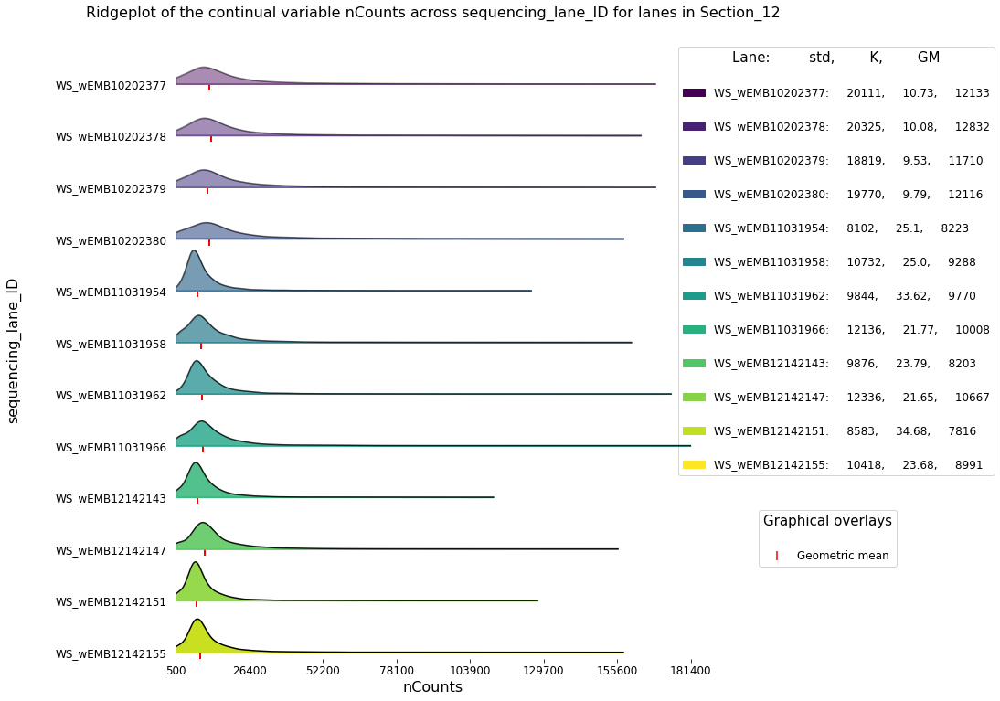

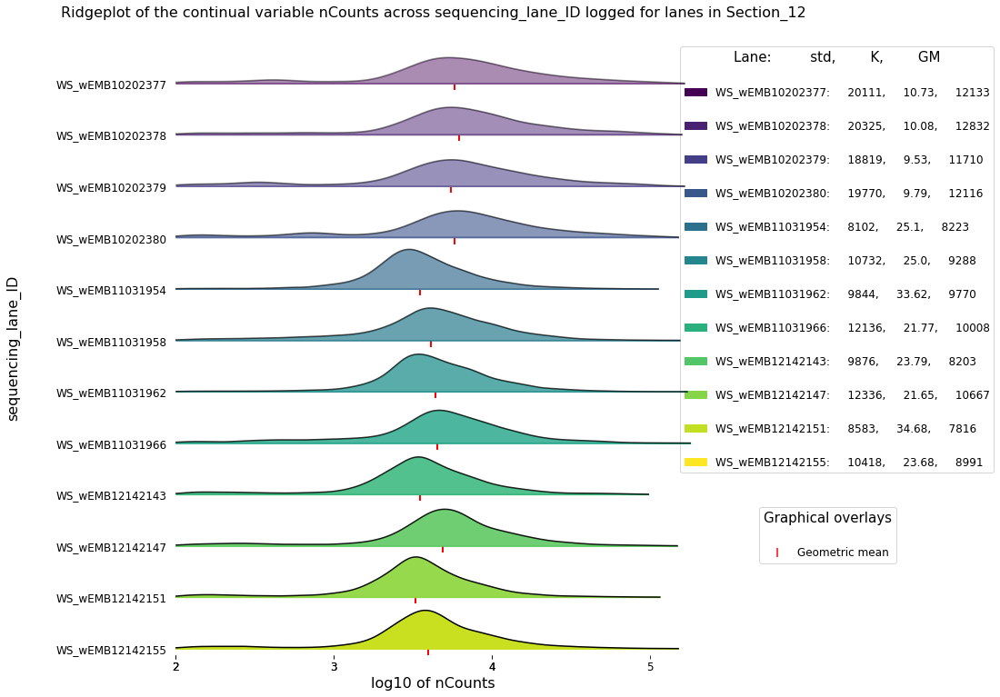

In [14]:
numbers = ['27','28','29','30','31','32','33','34','35','36','37','38','39','40','41','42','43','44','45','46','47','48','49','50','51','52','53','54','55','56','57','58','59','60','61','62','63','64','65','66','67','68','69','70','71','72','73','74']

# Make ridgeplots    

for n, s in enumerate(adata.obs['spatial_location'].unique()):
    #sub_df = adata.obs[adata.obs['spatial_location'].isin([s])].copy()
    sub_df = adata.obs.loc[adata.obs['spatial_location'].isin([s])].copy()
    
    plots_df = pd.DataFrame(columns=['cat1','cat2','scale_log','tick_no'])

    # Add what options you want to visualise
    plots_df.loc[0] = ['sequencing_lane_ID','nGene',False,8]
    plots_df.loc[1] = ['sequencing_lane_ID','nGene',True,8]
    plots_df.loc[2] = ['sequencing_lane_ID','nCounts',False,8]
    plots_df.loc[3] = ['sequencing_lane_ID','nCounts',True,8]
    
    # Make ridgeplots

    for row in plots_df.index:
        
        cat1 = plots_df.iloc[row]['cat1']
        cat2 = plots_df.iloc[row]['cat2']
        scale_log = plots_df.iloc[row]['scale_log']
        cmap = plt.cm.viridis
        tick_no = plots_df.iloc[row]['tick_no']
        
        print('='*120)   
        if scale_log == True:
            sub_df['log_scaled_col'] = np.log10(sub_df[cat2])
            cat_use = 'log_scaled_col'
        else:
            cat_use = cat2
        
        x_lim_range = [sub_df[[cat_use,cat1]][cat_use].min(),sub_df[[cat_use,cat1]][cat_use].max()]
        
        array = []
        ticks = np.linspace(int(x_lim_range[0]), int(x_lim_range[1]), num=tick_no, dtype=int)
        array.append(ticks[0])
            
        if scale_log == True:
            for i in ticks[1:]:
                array.append(math.ceil(i))
        else:
            for i in ticks[1:]:
                array.append(math.ceil(i / 100) *100)
        
        values = []
        for i in sub_df['sequencing_lane_ID'].unique():
            v = sub_df[cat_use][sub_df['sequencing_lane_ID'].isin([i])].values
            values.append(v)
        
        
        fig, axes = joypy.joyplot(values, labels=sub_df['sequencing_lane_ID'].unique(), colormap=cmap, fade = True, range_style='group', x_range=x_lim_range, tails=0, xlim='max',  figsize = (10,10), overlap = 0, ylabelsize=12, xlabelsize=12) 
        
        axes[-1].set_xticks(array)
        
        
        if scale_log == True:
            plt.title(f'Ridgeplot of the continual variable {cat2} across {cat1} logged for lanes in {s}', fontsize=16, y=1.03)
            axes[-1].set_xlabel(f'log10 of {cat2}', fontsize=16, color='black', alpha=1)
        else:
            plt.title(f'Ridgeplot of the continual variable {cat2} across {cat1} for lanes in {s}', fontsize=16, y=1.03)
            axes[-1].set_xlabel(cat2, fontsize=16, color='black', alpha=1)
        #axes[-1].xaxis.set_label_coords(0.5,-50)
        
        axes[-1].yaxis.set_visible(True)
        axes[-1].set_yticks([])
        axes[-1].set_ylabel(cat1, fontsize=16, color='black', alpha=1)
        axes[-1].yaxis.set_label_coords(-0.3,0.5)
        
        #patches = [[]] * (len(axes)-1) 
        #counter=0
        #for i in axes:
        #    if counter > (len(patches) -1):
        #        break
        #    current_handles, current_labels = axes[counter].get_legend_handles_labels()
        #    patches[counter] = ((current_handles[0].get_edgecolor()).tolist()[0]) ########
        #    counter+=1
        
        cmap = mpl.cm.get_cmap('viridis', len(sub_df['sequencing_lane_ID'].unique()))
        patches = cmap.colors.tolist()
        
        
        
        
        
        counter = 0
        labels = list(sub_df[cat1].unique())
        lengend_patches = []
        
        gmeans = []
        for i in patches:
            std_ = int(sub_df[sub_df[cat1].isin([labels[counter]])][cat2].std())
            kur_ = round(stats.kurtosis(sub_df[sub_df[cat1].isin([labels[counter]])][cat2]), 2)
            gmean_ = int(stats.gmean(sub_df[sub_df[cat1].isin([labels[counter]])][cat2]))
            gmeans.append(gmean_)
            lengend_patches.append(mpatches.Patch(color=i, label=r'{a}:     {b},     {c},     {d}'.format(a=labels[counter], b=std_, c=kur_, d=gmean_))) #'
            counter+=1
        
            
        legend1 = plt.legend(handles=lengend_patches, title='Lane:         std,        K,        GM', bbox_to_anchor=(1.6, 1), labelspacing = 2, fontsize=12, title_fontsize=15)
        #plt.setp(legend.get_title(), color='red')
        
        counter=0
        for i in patches:
            if scale_log == True:
                X = np.log10(gmeans[counter])
            else:
                X = gmeans[counter]
            axes[counter].axvline(X, color='red', lw=2, alpha=1, ymax=0.1)
            
            #if counter == (len(patches)-1):
            #    plt.text(x=gmeans[counter] - (gmeans[counter])/4, y=-0.05, s='Geometric mean', alpha=1, fontdict = {'color': 'r', 'fontsize' : '14'}) #axes[counter]
                
            counter+=1
        
        
        # 2nd legend
        
        line1 = Line2D([], [], color='red', marker='|', linestyle='None',
                                  markersize=10, markeredgewidth=1.5, label='Geometric mean')
        
        legend2 = plt.legend(handles=[line1], title='Graphical overlays', bbox_to_anchor=(1.41, 0.25), labelspacing = 2, fontsize=12, title_fontsize=15)
        
        plt.gca().add_artist(legend1)
        plt.savefig(Metadata_out_path+'05_QC_plot_'+ numbers[n] +'.pdf', bbox_inches="tight")
        plt.show()
        print('='*120)
        

### Ridgeplots
- The ridgeplots gave a better overlook of the distibutions of nGenes and nCounts when plotted on a logged scale due to large range values
- This made it much clearer the actual distribution for lanes of interest highlighted using violin plots e.g. WS_wEMB11031950 in Section_08 signifying cutoffs at the low end will impact this lane more than others within Section_08

## Direct comparison of nGene and nCount

Now nGene and nCount have been looked at independently from one another it is also good to compare them against one another and visually see how correlated they may be

### Scatter plots to compare correlation between nGene and nCounts
- From the inital scatter plot using scanpy function show nGene and nCounts seem to be correlated with one another
- Plotting both together and overlaying potential cutoffs will give a better visual idea of how much of the data applying these cutoffs will remove and the overlap of cells removed
- Histogram to show density of each category also plotted to assist with interpreting how much data is potentially being removed

In [15]:
# Simple corr check before plotting to get an idea of the trend between the 2 sets of data:
corr_val = adata.obs['nCounts'].corr(adata.obs['nGene'])
print(f'Simple Correlation calculation between nGene and nCounts: {corr_val}')

Simple Correlation calculation between nGene and nCounts: 0.8394168254506529


# Observe Donors

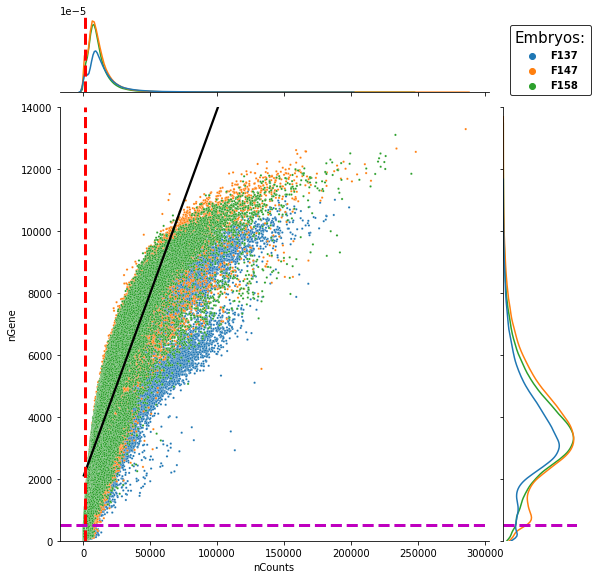

In [16]:
mpl.rcParams.update(inline_rc)
# Overlay n_gene and n_count cutoffs want to apply to data

# non logged graph 

g = sns.JointGrid(data=adata.obs, 
                  x="nCounts",
                  y="nGene",
                 height=8, ratio=5, hue='haniffa_ID')
s = sns.scatterplot(x=adata.obs['nCounts'], y=adata.obs['nGene'], hue=adata.obs['haniffa_ID'], legend=True, s=5,ax=g.ax_joint)
sns.kdeplot(x=adata.obs['nCounts'],hue=adata.obs['haniffa_ID'],legend=False,ax=g.ax_marg_x)
sns.kdeplot(y=adata.obs['nGene'],hue=adata.obs['haniffa_ID'],legend=False,ax=g.ax_marg_y)
sns.regplot(x=adata.obs['nCounts'], y=adata.obs['nGene'], scatter=False,line_kws={"color": "black"}, ax=g.ax_joint)

y_max = round(adata.obs['nGene'].max(),-3)
if (y_max < adata.obs['nGene'].max()):
    y_max = y_max + 1000
else:
    pass
y_max
g.ax_joint.set(ylim=(0, y_max))

for i in [g.ax_joint.axvline, g.ax_marg_x.axvline]:
    i(1000, color='r', ls='--', lw=3) # n_counts cutoff

for i in [g.ax_joint.axhline, g.ax_marg_y.axhline]:
    i(500, color='m', ls='--', lw=3) # n_genes cutoff

#g.ax_joint.axvline(2000, color='r', ls='--', lw=3)
#g.ax_joint.axhline(500, color='m', ls='--', lw=3)
#g.ax_marg_x.axvline(2000, color='r', ls='--', lw=3)
#g.ax_marg_y.axhline(500, color='m', ls='--', lw=3)

handles, labels = s.get_legend_handles_labels()

legend = s.get_legend()
legend.remove()

legend_properties = {'weight':'bold','size':10}
legendMain=g.ax_joint.legend(handles,labels,prop=legend_properties,bbox_to_anchor=(1.25, 1.20),title='Embryos:',title_fontsize=15, edgecolor='black', fancybox=True, borderpad=0.5)

g.savefig(Metadata_out_path+'05_QC_plot_75.pdf')

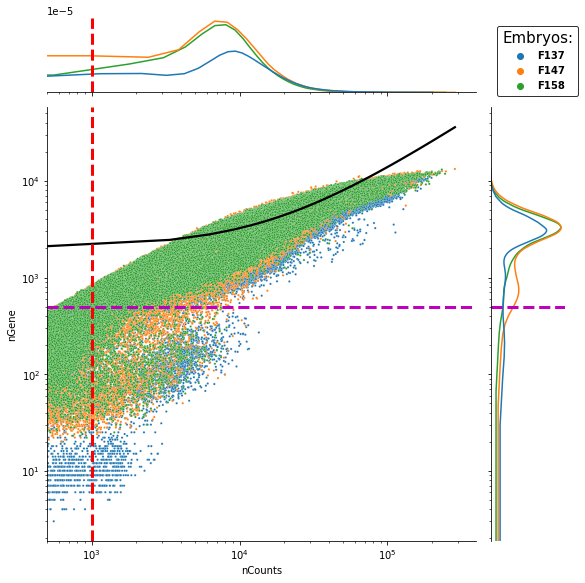

In [17]:
mpl.rcParams.update(inline_rc)
# Hard to see cutoffs on all data on scatterplot and histograms, logging graph to better see effect of cutoffs on data visually

# logged graph 

g = sns.JointGrid(data=adata.obs, 
                  x="nCounts",
                  y="nGene",
                 height=8, ratio=5, hue='haniffa_ID')
s = sns.scatterplot(x=adata.obs['nCounts'], y=adata.obs['nGene'], hue=adata.obs['haniffa_ID'], legend=True,  s=5,ax=g.ax_joint)
sns.kdeplot(x=adata.obs['nCounts'],hue=adata.obs['haniffa_ID'],legend=False,ax=g.ax_marg_x)
sns.kdeplot(y=adata.obs['nGene'],hue=adata.obs['haniffa_ID'],legend=False,ax=g.ax_marg_y)
sns.regplot(x=adata.obs['nCounts'], y=adata.obs['nGene'], scatter=False,line_kws={"color": "black"}, ax=g.ax_joint)

for i in [g.ax_joint.axvline, g.ax_marg_x.axvline]:
    i(1000, color='r', ls='--', lw=3) # n_counts cutoff

for i in [g.ax_joint.axhline, g.ax_marg_y.axhline]:
    i(500, color='m', ls='--', lw=3) # n_genes cutoff
    
#g.ax_joint.axvline(2000, color='r', ls='--', lw=3)
#g.ax_joint.axhline(500, color='m', ls='--', lw=3)
#g.ax_marg_x.axvline(2000, color='r', ls='--', lw=3)
#g.ax_marg_y.axhline(500, color='m', ls='--', lw=3)

g.ax_joint.set_xscale('log')
g.ax_joint.set_yscale('log')

handles, labels = s.get_legend_handles_labels()

legend = s.get_legend()
legend.remove()

legend_properties = {'weight':'bold','size':10}
legendMain=g.ax_joint.legend(handles,labels,prop=legend_properties,bbox_to_anchor=(1.25, 1.20),title='Embryos:',title_fontsize=15, edgecolor='black', fancybox=True, borderpad=0.5)
g.savefig(Metadata_out_path+'05_QC_plot_76.pdf')

# Observe per donor

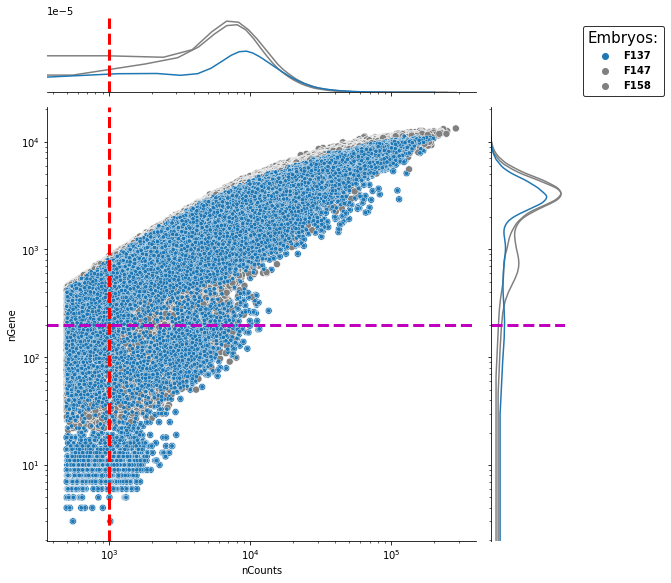

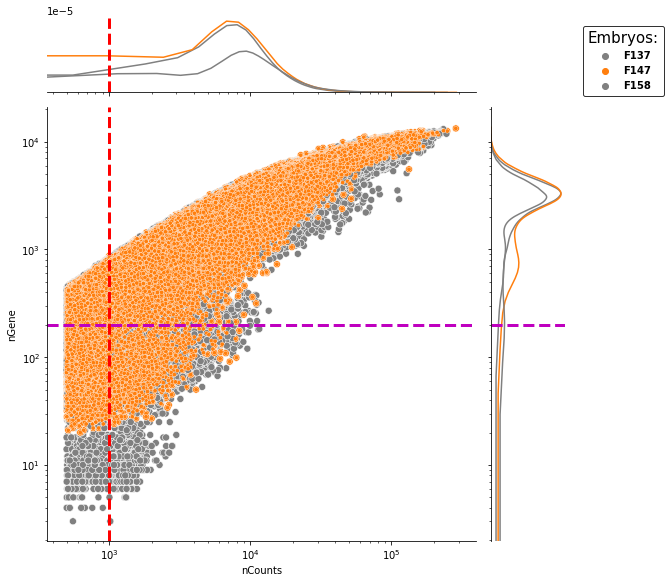

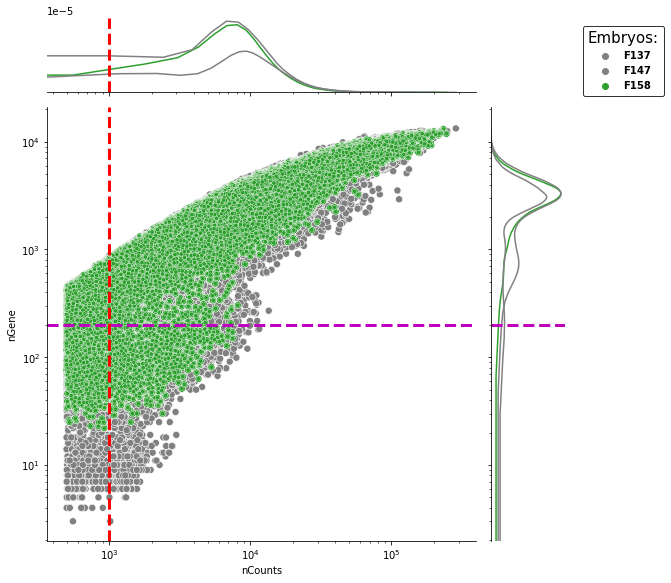

In [18]:
col_df = pd.DataFrame()
col_df['donor'] = adata.obs['haniffa_ID'].unique()
col_df['col'] = adata.uns['haniffa_ID_colors']
#col_df['size'] = 50

key = 'haniffa_ID'


numbers = ['77','78','79']


for count, i in enumerate(adata.obs[key].unique()): # make sure order is correct
    
    adata.obs['size'] = 50 # hard reset 
    adata.obs.loc[adata.obs[key].isin([i]), 'size'] = 5000 # category of interest
    
    pal = ['#808080']*len(adata.obs[key].unique())
    pal[count] = col_df.iloc[count]['col']
    
    
    mpl.rcParams.update(inline_rc)
    g = sns.JointGrid(data=adata.obs, 
                      x="nCounts",
                      y="nGene",
                     height=8, ratio=5, hue=key, palette = pal)
    s = sns.scatterplot(x=adata.obs['nCounts'], y=adata.obs['nGene'], hue=adata.obs[key], legend=True,  ax=g.ax_joint, palette=pal, s=50) # size=adata.obs['size']
    #sub_data = adata[adata.obs['orig_sample'].isin([i])]
    sns.kdeplot(x=adata.obs['nCounts'],hue=adata.obs[key],legend=False,ax=g.ax_marg_x, palette=pal)
    sns.kdeplot(y=adata.obs['nGene'],hue=adata.obs[key],legend=False,ax=g.ax_marg_y, palette=pal)
    #sns.regplot(x=adata.obs['nCounts'], y=adata.obs['nGene'], scatter=False,line_kws={"color": "black"}, ax=g.ax_joint)
    
    sns.scatterplot(x=adata.obs['nCounts'][adata.obs[key].isin([i])], y=adata.obs['nGene'][adata.obs[key].isin([i])], hue=adata.obs[key][adata.obs[key].isin([i])], legend=False, ax=g.ax_joint, palette=pal, size=50) # s=50, adata.obs['size'][adata.obs[key].isin([i])]
    
    
    #for i in [g.ax_joint.axvline, g.ax_marg_x.axvline]:
    #    i(1000, color='r', ls='--', lw=3) # n_counts cutoff
    
    #for i in [g.ax_joint.axhline, g.ax_marg_y.axhline]:
    #    i(500, color='m', ls='--', lw=3) # n_genes cutoff
        
    g.ax_joint.axvline(1000, color='r', ls='--', lw=3)
    g.ax_joint.axhline(200, color='m', ls='--', lw=3)
    g.ax_marg_x.axvline(1000, color='r', ls='--', lw=3)
    g.ax_marg_y.axhline(200, color='m', ls='--', lw=3)
    
    g.ax_joint.set_xscale('log')
    g.ax_joint.set_yscale('log')
    
    handles, labels = s.get_legend_handles_labels()
    
    #legend = s.get_legend()
    #legend.remove()
    
    legend_properties = {'weight':'bold','size':10}
    legendMain=g.ax_joint.legend(handles,labels,prop=legend_properties,bbox_to_anchor=(1.45, 1.20),title='Embryos:',title_fontsize=15, edgecolor='black', fancybox=True, borderpad=0.5)
    
    g.savefig(Metadata_out_path+'05_QC_plot_' + numbers[count] + '.pdf')
    
del adata.obs['size']

# Observe Sections

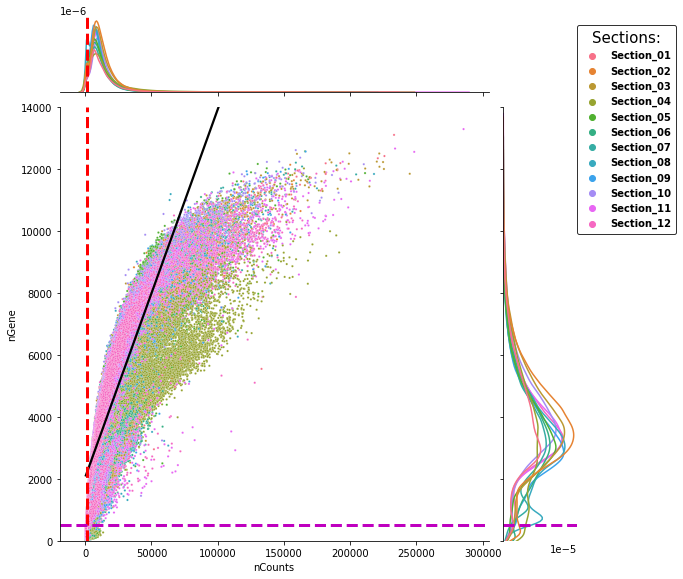

In [19]:
mpl.rcParams.update(inline_rc)
# Overlay n_gene and n_count cutoffs want to apply to data

# non logged graph 

g = sns.JointGrid(data=adata.obs, 
                  x="nCounts",
                  y="nGene",
                 height=8, ratio=5, hue='spatial_location')
s = sns.scatterplot(x=adata.obs['nCounts'], y=adata.obs['nGene'], hue=adata.obs['spatial_location'], legend=True, s=5,ax=g.ax_joint)
sns.kdeplot(x=adata.obs['nCounts'],hue=adata.obs['spatial_location'],legend=False,ax=g.ax_marg_x)
sns.kdeplot(y=adata.obs['nGene'],hue=adata.obs['spatial_location'],legend=False,ax=g.ax_marg_y)
sns.regplot(x=adata.obs['nCounts'], y=adata.obs['nGene'], scatter=False,line_kws={"color": "black"}, ax=g.ax_joint)

y_max = round(adata.obs['nGene'].max(),-3)
if (y_max < adata.obs['nGene'].max()):
    y_max = y_max + 1000
else:
    pass
y_max
g.ax_joint.set(ylim=(0, y_max))

for i in [g.ax_joint.axvline, g.ax_marg_x.axvline]:
    i(1000, color='r', ls='--', lw=3) # n_counts cutoff

for i in [g.ax_joint.axhline, g.ax_marg_y.axhline]:
    i(500, color='m', ls='--', lw=3) # n_genes cutoff

#g.ax_joint.axvline(2000, color='r', ls='--', lw=3)
#g.ax_joint.axhline(500, color='m', ls='--', lw=3)
#g.ax_marg_x.axvline(2000, color='r', ls='--', lw=3)
#g.ax_marg_y.axhline(500, color='m', ls='--', lw=3)

handles, labels = s.get_legend_handles_labels()

legend = s.get_legend()
legend.remove()

legend_properties = {'weight':'bold','size':10}
legendMain=g.ax_joint.legend(handles,labels,prop=legend_properties,bbox_to_anchor=(1.45, 1.20),title='Sections:',title_fontsize=15, edgecolor='black', fancybox=True, borderpad=0.5)

g.savefig(Metadata_out_path+'05_QC_plot_80.pdf')

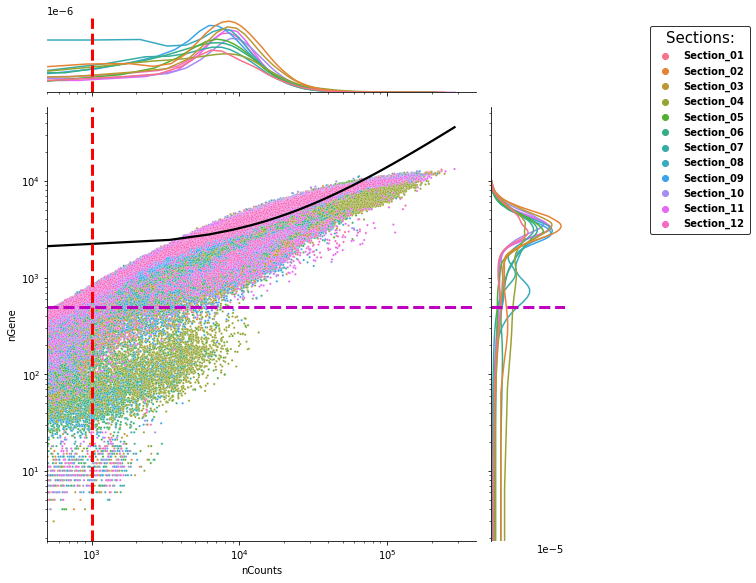

In [20]:
mpl.rcParams.update(inline_rc)
# Hard to see cutoffs on all data on scatterplot and histograms, logging graph to better see effect of cutoffs on data visually

# logged graph 

g = sns.JointGrid(data=adata.obs, 
                  x="nCounts",
                  y="nGene",
                 height=8, ratio=5, hue='spatial_location')
s = sns.scatterplot(x=adata.obs['nCounts'], y=adata.obs['nGene'], hue=adata.obs['spatial_location'], legend=True,  s=5,ax=g.ax_joint)
sns.kdeplot(x=adata.obs['nCounts'],hue=adata.obs['spatial_location'],legend=False,ax=g.ax_marg_x)
sns.kdeplot(y=adata.obs['nGene'],hue=adata.obs['spatial_location'],legend=False,ax=g.ax_marg_y)
sns.regplot(x=adata.obs['nCounts'], y=adata.obs['nGene'], scatter=False,line_kws={"color": "black"}, ax=g.ax_joint)

for i in [g.ax_joint.axvline, g.ax_marg_x.axvline]:
    i(1000, color='r', ls='--', lw=3) # n_counts cutoff

for i in [g.ax_joint.axhline, g.ax_marg_y.axhline]:
    i(500, color='m', ls='--', lw=3) # n_genes cutoff
    
#g.ax_joint.axvline(2000, color='r', ls='--', lw=3)
#g.ax_joint.axhline(500, color='m', ls='--', lw=3)
#g.ax_marg_x.axvline(2000, color='r', ls='--', lw=3)
#g.ax_marg_y.axhline(500, color='m', ls='--', lw=3)

g.ax_joint.set_xscale('log')
g.ax_joint.set_yscale('log')

handles, labels = s.get_legend_handles_labels()

legend = s.get_legend()
legend.remove()

legend_properties = {'weight':'bold','size':10}
legendMain=g.ax_joint.legend(handles,labels,prop=legend_properties,bbox_to_anchor=(1.65, 1.20),title='Sections:',title_fontsize=15, edgecolor='black', fancybox=True, borderpad=0.5)
g.savefig(Metadata_out_path+'05_QC_plot_81.pdf')

# Observe per section

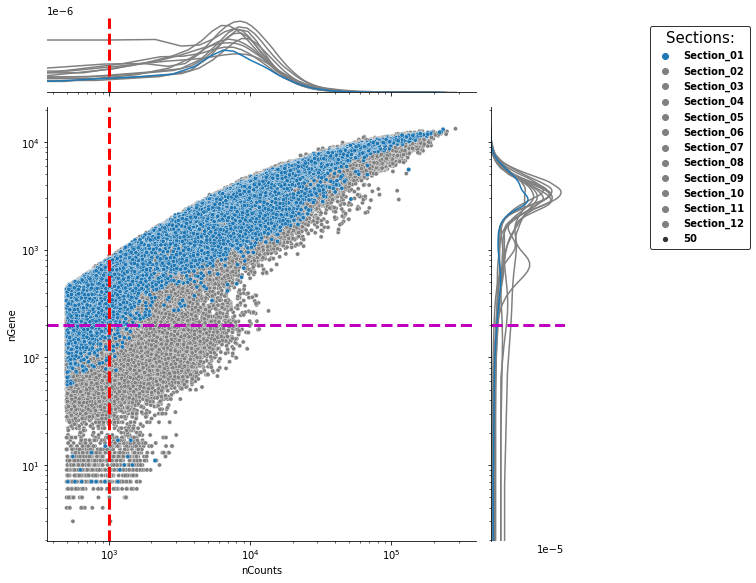

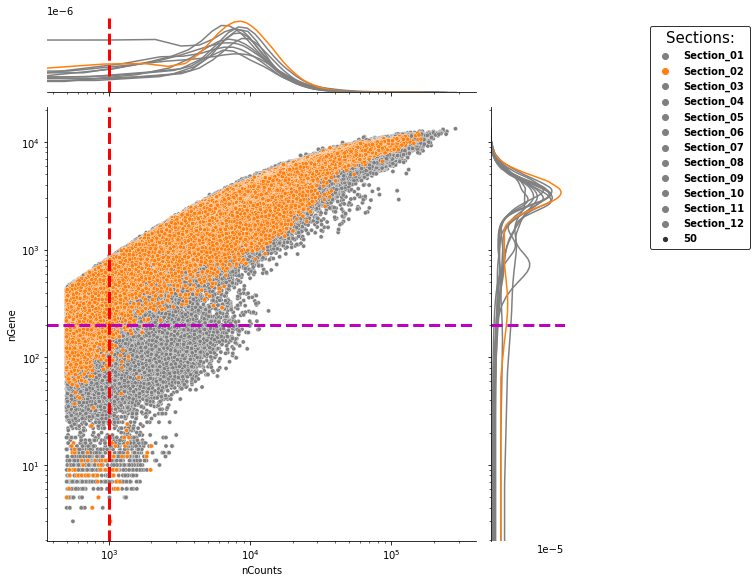

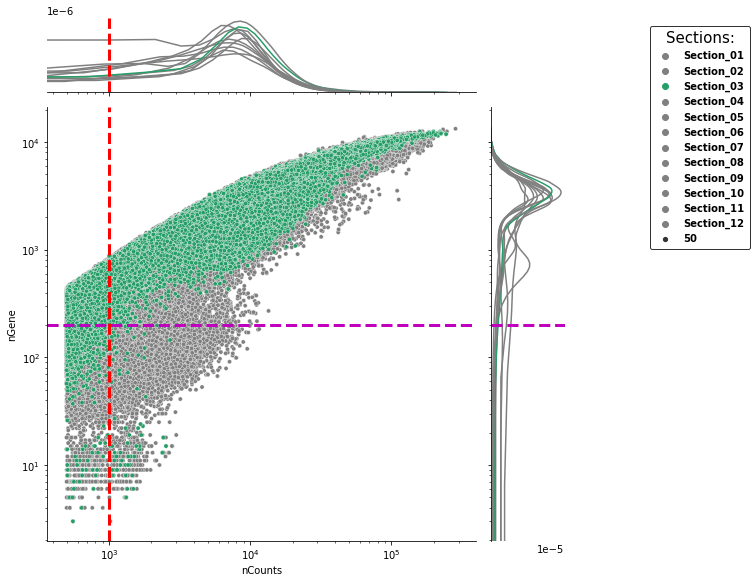

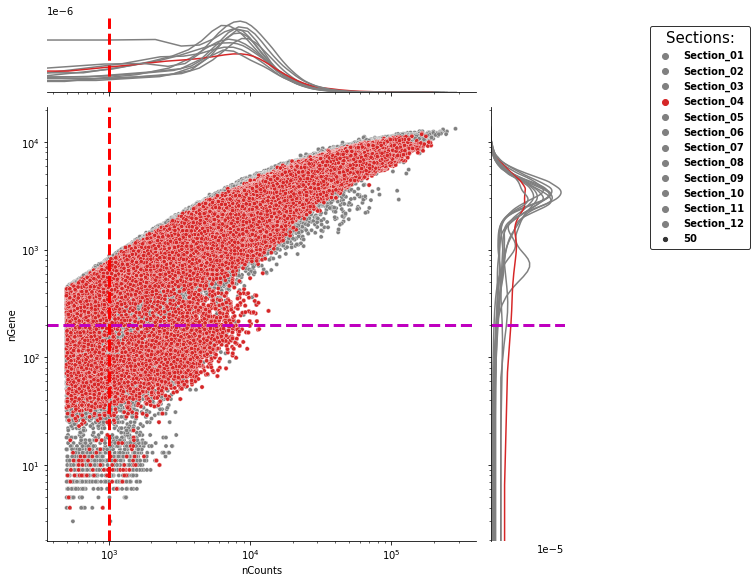

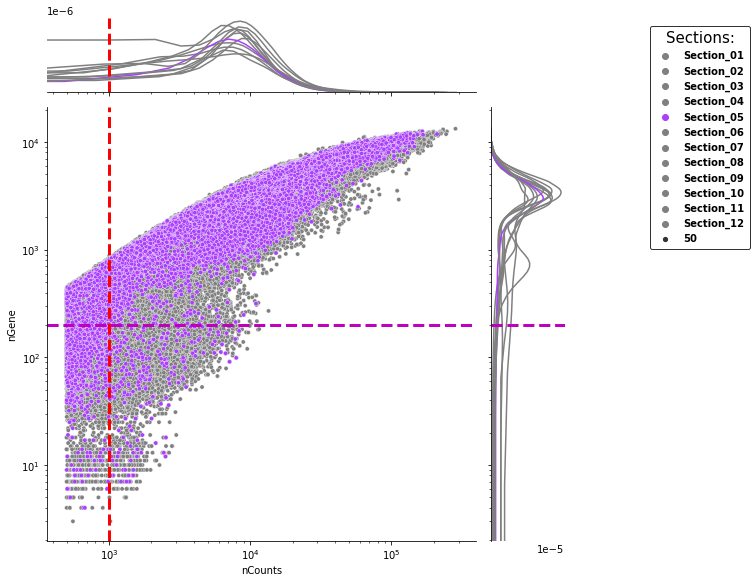

...

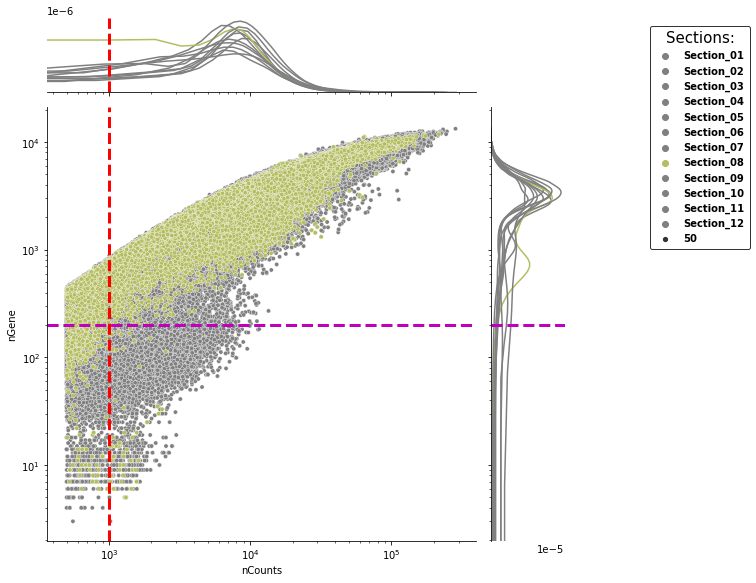

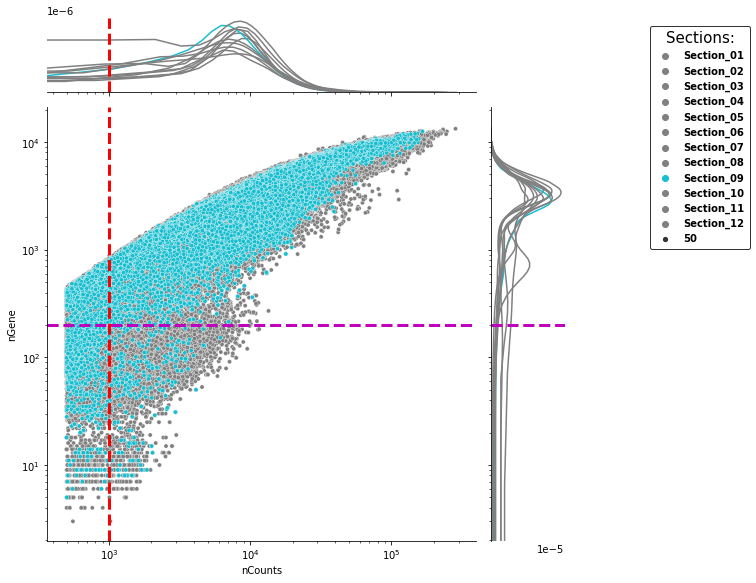

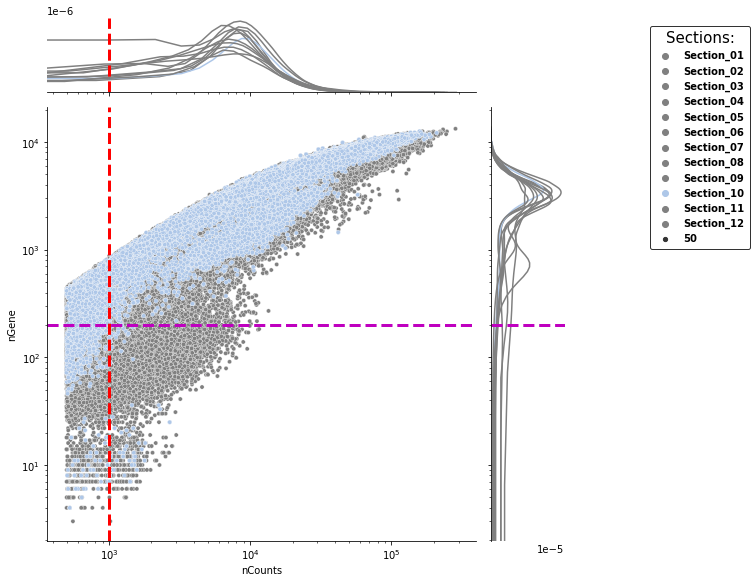

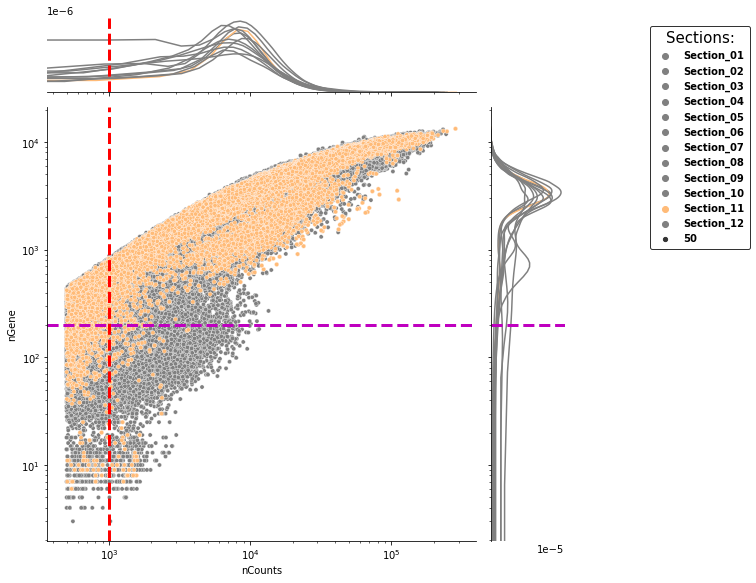

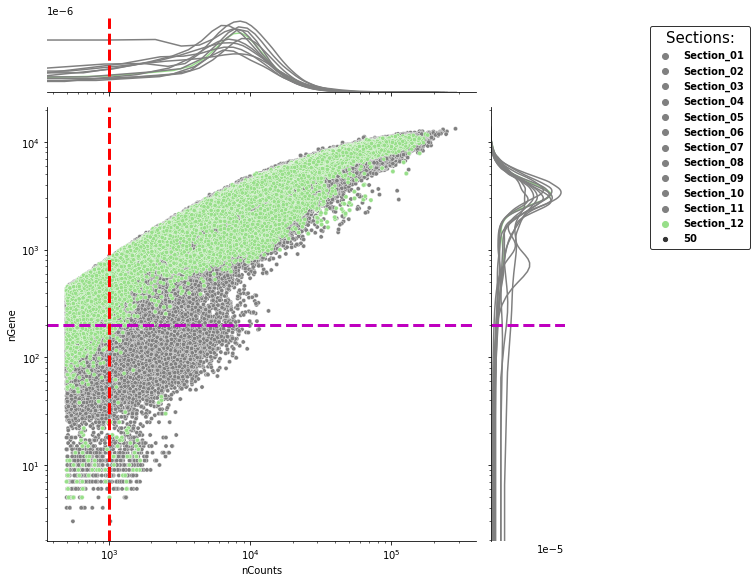

In [21]:
col_df = pd.DataFrame()
col_df['donor'] = adata.obs['spatial_location'].unique()
col_df['col'] =  adata.uns['spatial_location_colors'] # if missing colours for column as not defined yet use '#FF0000'

key = 'spatial_location'

numbers = ['82','83','84','85','86','87','88','89','90','91','92','93']

for count, i in enumerate(adata.obs[key].unique()): # make sure order is correct
    
    pal = ['#808080']*len(adata.obs[key].unique())
    pal[count] = col_df.iloc[count]['col']
    
    
    mpl.rcParams.update(inline_rc)
    g = sns.JointGrid(data=adata.obs, 
                      x="nCounts",
                      y="nGene",
                     height=8, ratio=5, hue=key, palette = pal)
    s = sns.scatterplot(x=adata.obs['nCounts'], y=adata.obs['nGene'], hue=adata.obs[key], legend=True,  s=5,ax=g.ax_joint, palette=pal, size=50) #
    #sub_data = adata[adata.obs['orig_sample'].isin([i])]
    sns.kdeplot(x=adata.obs['nCounts'],hue=adata.obs[key],legend=False,ax=g.ax_marg_x, palette=pal)
    sns.kdeplot(y=adata.obs['nGene'],hue=adata.obs[key],legend=False,ax=g.ax_marg_y, palette=pal)
    #sns.regplot(x=adata.obs['nCounts'], y=adata.obs['nGene'], scatter=False,line_kws={"color": "black"}, ax=g.ax_joint)
    
    # replot the section of interest of it is on top
    sns.scatterplot(x=adata.obs['nCounts'][adata.obs[key].isin([i])], y=adata.obs['nGene'][adata.obs[key].isin([i])], hue=adata.obs[key][adata.obs[key].isin([i])], legend=False, ax=g.ax_joint, palette=pal, size=50) # s=50, 
    
    
    #for i in [g.ax_joint.axvline, g.ax_marg_x.axvline]:
    #    i(1000, color='r', ls='--', lw=3) # n_counts cutoff
    
    #for i in [g.ax_joint.axhline, g.ax_marg_y.axhline]:
    #    i(500, color='m', ls='--', lw=3) # n_genes cutoff
        
    g.ax_joint.axvline(1000, color='r', ls='--', lw=3)
    g.ax_joint.axhline(200, color='m', ls='--', lw=3)
    g.ax_marg_x.axvline(1000, color='r', ls='--', lw=3)
    g.ax_marg_y.axhline(200, color='m', ls='--', lw=3)
    
    g.ax_joint.set_xscale('log')
    g.ax_joint.set_yscale('log')
    
    handles, labels = s.get_legend_handles_labels()
    
    #legend = s.get_legend()
    #legend.remove()
    
    legend_properties = {'weight':'bold','size':10}
    legendMain=g.ax_joint.legend(handles,labels,prop=legend_properties,bbox_to_anchor=(1.65, 1.20),title='Sections:',title_fontsize=15, edgecolor='black', fancybox=True, borderpad=0.5)
    
    g.savefig(Metadata_out_path+'05_QC_plot_' + numbers[count] + '.pdf')

- Scatterplots and quick correlation calculation do show a high positive correlation between nGene and nCounts 
- Viaually it first appears that nGene may be removing more cells than nCounts however scales suggest that actually nCounts will remove more cells
- Most of the cells to be removed do intersect between nGene and nCounts
- This visualisation also highlights that Section_04 will be impacted the most by nGene and nCount cutoffs

## More Quantatative like investigation

As all the plots above have been qualatative in nature it would be good to also investigate the distributions and cutoffs to be applied quantitatively. Below tries to help towards this

### Basic stats on nGene and nCounts
- This is to show distribution more numerically to go alongisde the visual aids above
- Histogram peaks are from the KDE plot which used peak detection previously in the notebook

In [22]:
# stat cutoffs

category1 = 'nGene'
category2 = 'nCounts'

mad1 = adata.obs[category1].mad()
med1 = adata.obs[category1].median()
thresh_up1_1 = med1+(1.4826*mad1)
thresh_up1_2 = med1+(2*mad1)
thresh_up1_3 = med1+(3*mad1)
thresh_down1_1 = med1-(1.4826*mad1)
thresh_down1_2 = med1-(2*mad1)
thresh_down1_3 = med1-(3*mad1)
KDE_lower_peak_x_value_1 = x_1[low_peak_1]
KDE_middle_peak_x_value_1 = x_1[other_peaks_1][0] # since only 1 value, if more than 1 replace with list

mad2 = adata.obs[category2].mad()
med2 = adata.obs[category2].median()
thresh_up2_1 = med2+(1.4826*mad2)
thresh_up2_2 = med2+(2*mad2)
thresh_up2_3 = med2+(3*mad2)
thresh_down2_1 = med2-(1.4826*mad2)
thresh_down2_2 = med2-(2*mad2)
thresh_down2_3 = med2-(3*mad2)
KDE_lower_peak_x_value_2 = (10 ** x_2[low_peak_2])

print("="*60, "\n")
print('\033[1m' + f'Data spread to consider when looking at the category {category1}:'+ '\033[0m', "\n")
display(adata.obs[[category1]].describe(percentiles=[.01,.05,.1,.25,.5,.75,.9]))
print("")
print(f'Median value                    : {med1}')
print(f'Median value + (MAD * 1.4826)   : {thresh_up1_1}')
print(f'Median value + (MAD * 2)        : {thresh_up1_2}')
print(f'Median value + (MAD * 3)        : {thresh_up1_3}')
print(f'Median value - (MAD * 1.4826)   : {thresh_down1_1}')
print(f'Median value - (MAD * 2)        : {thresh_down1_2}')
print(f'Median value - (MAD * 3)        : {thresh_down1_3}', "\n")
print(f'Histogram lower peak value      : {KDE_lower_peak_x_value_1}')
print(f'Histogram middle peak value     : {KDE_middle_peak_x_value_1}')
print("")
print("="*60, "\n")
print('\033[1m' + f'Data spread to consider when looking at the category {category2}:'+ '\033[0m', "\n")
display(adata.obs[[category2]].describe(percentiles=[.01,.05,.1,.25,.5,.75,.9]))
print("")
print(f'Median value                    : {med2}')
print(f'Median value + (MAD * 1.4826)   : {thresh_up2_1}')
print(f'Median value + (MAD * 2)        : {thresh_up2_2}')
print(f'Median value + (MAD * 3)        : {thresh_up2_3}')
print(f'Median value - (MAD * 1.4826)   : {thresh_down2_1}')
print(f'Median value - (MAD * 2)        : {thresh_down2_2}')
print(f'Median value - (MAD * 3)        : {thresh_down2_3}', "\n")
print(f'Histogram lower peak value      : {KDE_lower_peak_x_value_2}')
print("")
print("="*60)


Data spread to consider when looking at the category nGene: 



,nGene
count,1.183081e+06
mean,3.593449e+03
std,1.713937e+03
min,3.000000e+00
1%,1.860000e+02
5%,8.010000e+02
10%,1.413000e+03
25%,2.534000e+03
50%,3.465000e+03
75%,4.544000e+03



Median value                    : 3465.0
Median value + (MAD * 1.4826)   : 5410.741101951543
Median value + (MAD * 2)        : 6089.768787200247
Median value + (MAD * 3)        : 7402.153180800371
Median value - (MAD * 1.4826)   : 1519.258898048457
Median value - (MAD * 2)        : 840.2312127997529
Median value - (MAD * 3)        : -472.1531808003706 

Histogram lower peak value      : 178.78728276648445
Histogram middle peak value     : 1017.9067704075892


Data spread to consider when looking at the category nCounts: 



,nCounts
count,1.183081e+06
mean,1.298608e+04
std,1.211521e+04
min,5.000000e+02
1%,6.420000e+02
5%,1.501000e+03
10%,3.150000e+03
25%,6.319000e+03
50%,1.000400e+04
75%,1.573300e+04



Median value                    : 10004.0
Median value + (MAD * 1.4826)   : 21267.042175683593
Median value + (MAD * 2)        : 25197.6357421875
Median value + (MAD * 3)        : 32794.45361328125
Median value - (MAD * 1.4826)   : -1259.042175683593
Median value - (MAD * 2)        : -5189.6357421875
Median value - (MAD * 3)        : -12786.45361328125 

Histogram lower peak value      : 1088.0680285126573



### Check how nGene and nCounts cutoffs would impact the data
- Here showing how much each cutoff would impact the data in a easy to view table format

In [23]:
cells_removed_by_n_genes_200   = list(adata.obs.index[adata.obs['nGene'] < 200])
cells_removed_by_n_genes_500   = list(adata.obs.index[adata.obs['nGene'] < 500])
cells_removed_by_n_counts_1000 = list(adata.obs.index[adata.obs['nCounts'] <= 1000])
cells_removed_by_n_counts_2000 = list(adata.obs.index[adata.obs['nCounts'] <= 2000])

cells_removed_by_gene_200_not_in_counts_1000 =  list(set(cells_removed_by_n_genes_200) - set(cells_removed_by_n_counts_1000))
cells_removed_by_gene_500_not_in_counts_1000 =  list(set(cells_removed_by_n_genes_500) - set(cells_removed_by_n_counts_1000))
cells_removed_by_gene_200_not_in_counts_2000 =  list(set(cells_removed_by_n_genes_200) - set(cells_removed_by_n_counts_2000))
cells_removed_by_gene_500_not_in_counts_2000 =  list(set(cells_removed_by_n_genes_500) - set(cells_removed_by_n_counts_2000))

cells_removed_by_counts_1000_not_in_gene_200 =  list(set(cells_removed_by_n_counts_1000) - set(cells_removed_by_n_genes_200))
cells_removed_by_counts_2000_not_in_gene_200 =  list(set(cells_removed_by_n_counts_2000) - set(cells_removed_by_n_genes_200))
cells_removed_by_counts_1000_not_in_gene_500 =  list(set(cells_removed_by_n_counts_1000) - set(cells_removed_by_n_genes_500))
cells_removed_by_counts_2000_not_in_gene_500 =  list(set(cells_removed_by_n_counts_2000) - set(cells_removed_by_n_genes_500))


cells_removed_by_gene_200_counts_1000_union = list(set(cells_removed_by_n_genes_200) | set(cells_removed_by_n_counts_1000))
cells_removed_by_gene_500_counts_1000_union = list(set(cells_removed_by_n_genes_500) | set(cells_removed_by_n_counts_1000))
cells_removed_by_gene_200_counts_2000_union = list(set(cells_removed_by_n_genes_200) | set(cells_removed_by_n_counts_2000))
cells_removed_by_gene_500_counts_2000_union = list(set(cells_removed_by_n_genes_500) | set(cells_removed_by_n_counts_2000))


data_percent_n_genes_200   = round((len(cells_removed_by_n_genes_200)   / len(adata.obs)) * 100,2)
data_percent_n_genes_500   = round((len(cells_removed_by_n_genes_500)   / len(adata.obs)) * 100,2)
data_percent_n_counts_1000 = round((len(cells_removed_by_n_counts_1000) / len(adata.obs)) * 100,2)
data_percent_n_counts_2000 = round((len(cells_removed_by_n_counts_2000) / len(adata.obs)) * 100,2)


data_percent_gene_200_not_in_counts_1000 = round((len(cells_removed_by_gene_200_not_in_counts_1000) / len(adata.obs)) * 100,2)
data_percent_gene_500_not_in_counts_1000 = round((len(cells_removed_by_gene_500_not_in_counts_1000) / len(adata.obs)) * 100,2)
data_percent_gene_200_not_in_counts_2000 = round((len(cells_removed_by_gene_200_not_in_counts_2000) / len(adata.obs)) * 100,2)
data_percent_gene_500_not_in_counts_2000 = round((len(cells_removed_by_gene_500_not_in_counts_2000) / len(adata.obs)) * 100,2)


data_percent_counts_1000_not_in_gene_200 = round((len(cells_removed_by_counts_1000_not_in_gene_200) / len(adata.obs)) * 100,2)
data_percent_counts_2000_not_in_gene_200 = round((len(cells_removed_by_counts_2000_not_in_gene_200) / len(adata.obs)) * 100,2)
data_percent_counts_1000_not_in_gene_500 = round((len(cells_removed_by_counts_1000_not_in_gene_500) / len(adata.obs)) * 100,2)
data_percent_counts_2000_not_in_gene_500 = round((len(cells_removed_by_counts_2000_not_in_gene_500) / len(adata.obs)) * 100,2)


data_percent_gene_200_counts_1000_union = round(((len(cells_removed_by_gene_200_counts_1000_union)) / len(adata.obs)) * 100,2)
data_percent_gene_500_counts_1000_union = round(((len(cells_removed_by_gene_500_counts_1000_union)) / len(adata.obs)) * 100,2)
data_percent_gene_200_counts_2000_union = round(((len(cells_removed_by_gene_200_counts_2000_union)) / len(adata.obs)) * 100,2)
data_percent_gene_500_counts_2000_union = round(((len(cells_removed_by_gene_500_counts_2000_union)) / len(adata.obs)) * 100,2)



dict_sum = {'Cutoff': ['nGene: 200', 'nGene: 500', 'nCounts: 1000', 'nCounts: 2000','nGene: 200 ∩ nCounts: 1000', 'nGene: 500 ∩ nCounts: 1000', 'nGene: 200 ∩ nCounts: 2000', 'nGene: 500 ∩ nCounts: 2000', 'nCounts: 1000 ∩ nGene: 200', 'nCounts: 1000 ∩ nGene: 500', 'nCounts: 2000 ∩ nGene: 200', 'nCounts: 2000 ∩ nGene: 500', 'nGene: 200 ∪ nCounts: 1000', 'nGene: 500 ∪ nCounts: 1000', 'nGene: 200 ∪ nCounts: 2000', 'nGene: 500 ∪ nCounts: 2000'],
        'No. Cells': [len(cells_removed_by_n_genes_200), len(cells_removed_by_n_genes_500), len(cells_removed_by_n_counts_1000), len(cells_removed_by_n_counts_2000), len(cells_removed_by_gene_200_not_in_counts_1000), len(cells_removed_by_gene_500_not_in_counts_1000), len(cells_removed_by_gene_200_not_in_counts_2000), len(cells_removed_by_gene_500_not_in_counts_2000), len(cells_removed_by_counts_1000_not_in_gene_200), len(cells_removed_by_counts_2000_not_in_gene_200), len(cells_removed_by_counts_1000_not_in_gene_500), len(cells_removed_by_counts_2000_not_in_gene_500), len(cells_removed_by_gene_200_counts_1000_union), len(cells_removed_by_gene_500_counts_1000_union), len(cells_removed_by_gene_200_counts_2000_union), len(cells_removed_by_gene_500_counts_2000_union),],
        '% of data': [data_percent_n_genes_200,data_percent_n_genes_500,data_percent_n_counts_1000,data_percent_n_counts_2000,data_percent_gene_200_not_in_counts_1000,data_percent_gene_500_not_in_counts_1000,data_percent_gene_200_not_in_counts_2000,data_percent_gene_500_not_in_counts_2000,data_percent_counts_1000_not_in_gene_200,data_percent_counts_2000_not_in_gene_200,data_percent_counts_1000_not_in_gene_500,data_percent_counts_2000_not_in_gene_500,data_percent_gene_200_counts_1000_union,data_percent_gene_500_counts_1000_union,data_percent_gene_200_counts_2000_union,data_percent_gene_500_counts_2000_union],
        'No. Cells in data before Cutoff': (len(adata.obs)),
        'No. Cells in data after Cutoff applied': [(len(adata.obs) - len(cells_removed_by_n_genes_200)),(len(adata.obs) - len(cells_removed_by_n_genes_500)),(len(adata.obs) - len(cells_removed_by_n_counts_1000)),(len(adata.obs) - len(cells_removed_by_n_counts_2000)),(len(adata.obs) - len(cells_removed_by_gene_200_not_in_counts_1000)),(len(adata.obs) - len(cells_removed_by_gene_500_not_in_counts_1000)),(len(adata.obs) - len(cells_removed_by_gene_200_not_in_counts_2000)),(len(adata.obs) - len(cells_removed_by_gene_500_not_in_counts_2000)),(len(adata.obs) - len(cells_removed_by_counts_1000_not_in_gene_200)),(len(adata.obs) - len(cells_removed_by_counts_2000_not_in_gene_200)),(len(adata.obs) - len(cells_removed_by_counts_1000_not_in_gene_500)),(len(adata.obs) - len(cells_removed_by_counts_2000_not_in_gene_500)),(len(adata.obs) - len(cells_removed_by_gene_200_counts_1000_union)),(len(adata.obs) - len(cells_removed_by_gene_500_counts_1000_union)),(len(adata.obs) - len(cells_removed_by_gene_200_counts_2000_union)),(len(adata.obs) - len(cells_removed_by_gene_500_counts_2000_union))],
           }
cutoff_summary = pd.DataFrame(dict_sum).set_index('Cutoff')            
            
print("="*100, "\n")
print('\033[1m' + f'Summary of cutoffs related to nGene and nCounts if applied to all embryos:'+ '\033[0m', "\n")
display(cutoff_summary)
print("="*100)          
            



Summary of cutoffs related to nGene and nCounts if applied to all embryos: 



,No. Cells,% of data,No. Cells in data before Cutoff,No. Cells in data after Cutoff applied
Cutoff,,,,
nGene: 200,12682,1.07,1183081,1170399
nGene: 500,31190,2.64,1183081,1151891
nCounts: 1000,35390,2.99,1183081,1147691
nCounts: 2000,78213,6.61,1183081,1104868
nGene: 200 ∩ nCounts: 1000,4278,0.36,1183081,1178803
nGene: 500 ∩ nCounts: 1000,8727,0.74,1183081,1174354
nGene: 200 ∩ nCounts: 2000,1870,0.16,1183081,1181211
nGene: 500 ∩ nCounts: 2000,3136,0.27,1183081,1179945
nCounts: 1000 ∩ nGene: 200,26986,2.28,1183081,1156095


## Quick exploration of mitochondrial percentage fo future cutoff after annotation
- Performing this now while data still contains all cells
- This is a good precheck for before the cutoff is applied after annotation

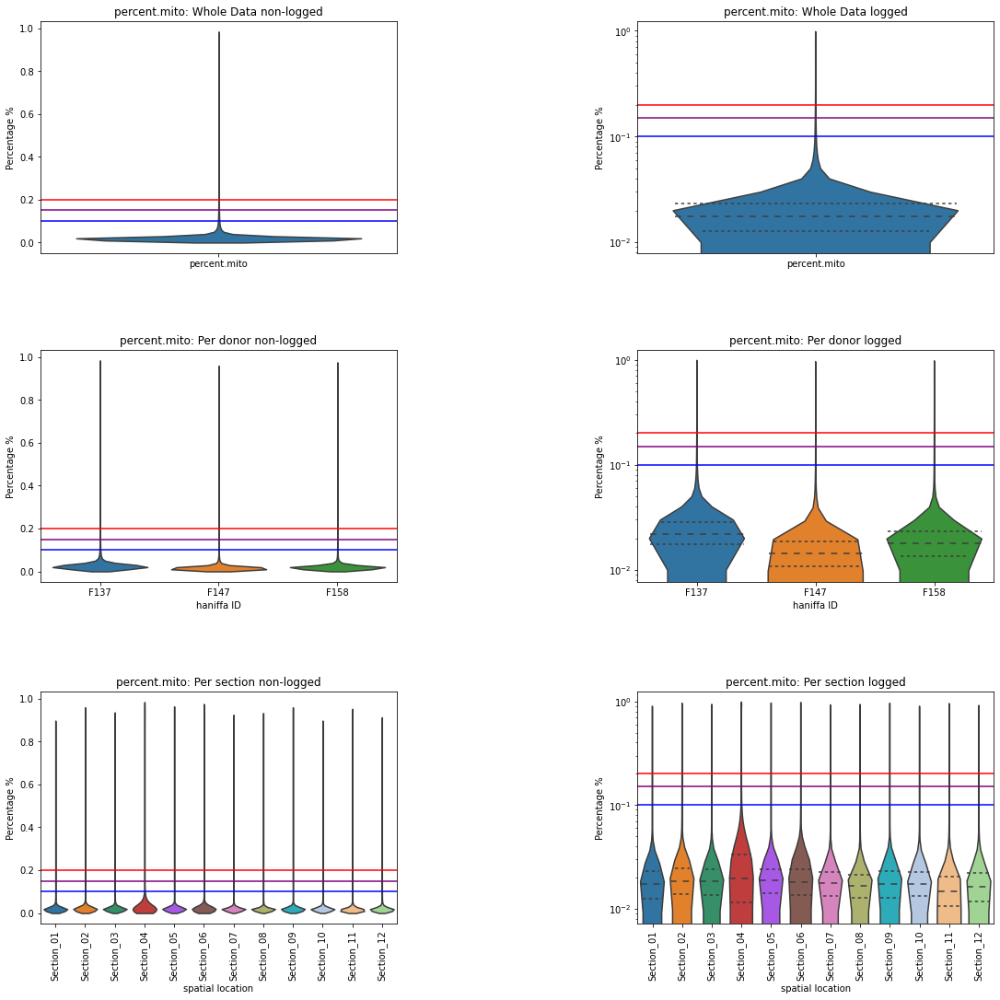

In [24]:
# Whole Data

mpl.rcParams.update(inline_rc)

fig = plt.figure(constrained_layout=True, figsize=(15,15))

ax1 = plt.subplot(3,2,1)
sc.pl.violin(adata,['percent.mito'], stripplot=False ,log=False, show=False, ax=ax1);
plt.axhline(y = 0.2, color = 'r', linestyle = '-') # default scanpy
plt.axhline(y = 0.15, color = 'purple', linestyle = '-')
plt.axhline(y = 0.1, color = 'b', linestyle = '-')
plt.title('percent.mito: Whole Data non-logged')
plt.ylabel('Percentage %')
ax2 = plt.subplot(3,2,2)
sc.pl.violin(adata,['percent.mito'], stripplot=False ,log=True, show=False, inner='quartile', ax=ax2);
plt.axhline(y = 0.2, color = 'r', linestyle = '-') # default scanpy
plt.axhline(y = 0.15, color = 'purple', linestyle = '-')
plt.axhline(y = 0.1, color = 'b', linestyle = '-')
plt.title('percent.mito: Whole Data logged')
plt.ylabel('Percentage %')


ax3 = plt.subplot(3,2,3)
sc.pl.violin(adata,['percent.mito'], stripplot=False ,log=False, show=False, ax=ax3, groupby='haniffa_ID');
plt.axhline(y = 0.2, color = 'r', linestyle = '-') # default scanpy
plt.axhline(y = 0.15, color = 'purple', linestyle = '-')
plt.axhline(y = 0.1, color = 'b', linestyle = '-')
plt.title('percent.mito: Per donor non-logged')
plt.ylabel('Percentage %')
ax4 = plt.subplot(3,2,4)
sc.pl.violin(adata,['percent.mito'], stripplot=False ,log=True, show=False, inner='quartile', ax=ax4, groupby='haniffa_ID');
plt.axhline(y = 0.2, color = 'r', linestyle = '-') # default scanpy
plt.axhline(y = 0.15, color = 'purple', linestyle = '-')
plt.axhline(y = 0.1, color = 'b', linestyle = '-')
plt.title('percent.mito: Per donor logged')
plt.ylabel('Percentage %')


ax5 = plt.subplot(3,2,5)
sc.pl.violin(adata,['percent.mito'], stripplot=False ,log=False, show=False, ax=ax5, groupby='spatial_location');
plt.axhline(y = 0.2, color = 'r', linestyle = '-') # default scanpy
plt.axhline(y = 0.15, color = 'purple', linestyle = '-')
plt.axhline(y = 0.1, color = 'b', linestyle = '-')
plt.title('percent.mito: Per section non-logged')
plt.ylabel('Percentage %')
plt.xticks(rotation=90)
ax6 = plt.subplot(3,2,6)
sc.pl.violin(adata,['percent.mito'], stripplot=False ,log=True, show=False, inner='quartile', ax=ax6, groupby='spatial_location');
plt.axhline(y = 0.2, color = 'r', linestyle = '-') # default scanpy
plt.axhline(y = 0.15, color = 'purple', linestyle = '-')
plt.axhline(y = 0.1, color = 'b', linestyle = '-')
plt.title('percent.mito: Per section logged')
plt.ylabel('Percentage %')
plt.xticks(rotation=90)


fig.set_constrained_layout_pads(w_pad=4 / 72, h_pad=4 / 72, hspace=0.2, wspace=0.4)
plt.show()
fig.savefig(Metadata_out_path+'05_QC_plot_94.pdf', bbox_inches='tight')

Trying to set attribute `.uns` of view, copying.


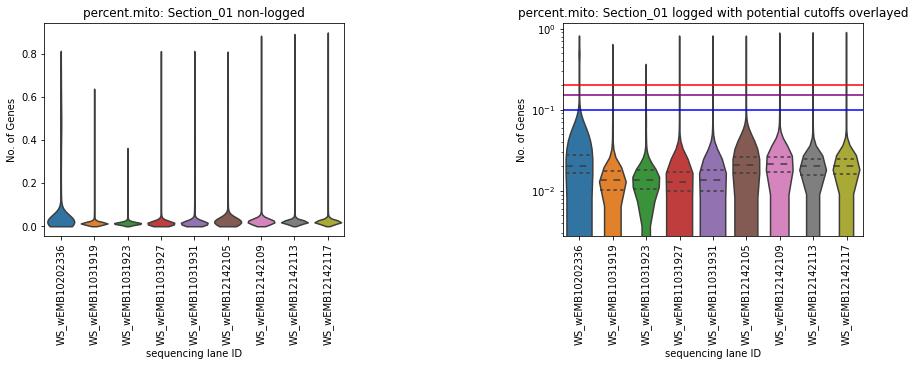

Trying to set attribute `.uns` of view, copying.


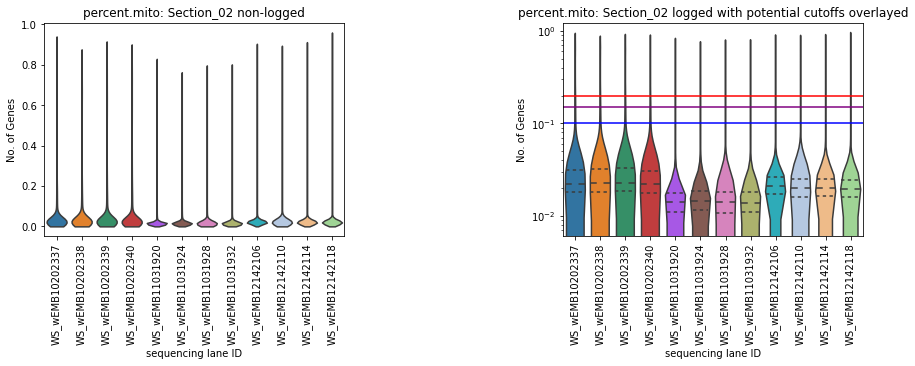

Trying to set attribute `.uns` of view, copying.


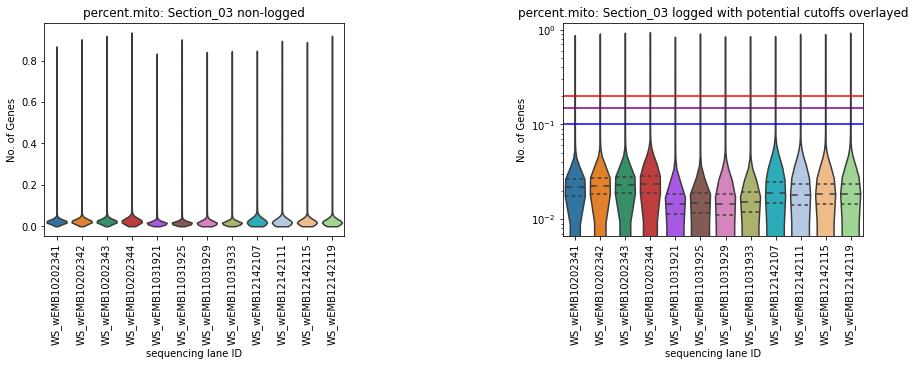

Trying to set attribute `.uns` of view, copying.


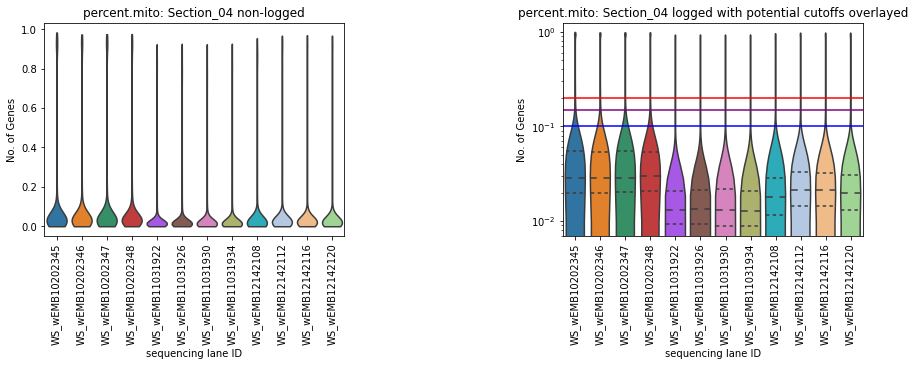

Trying to set attribute `.uns` of view, copying.


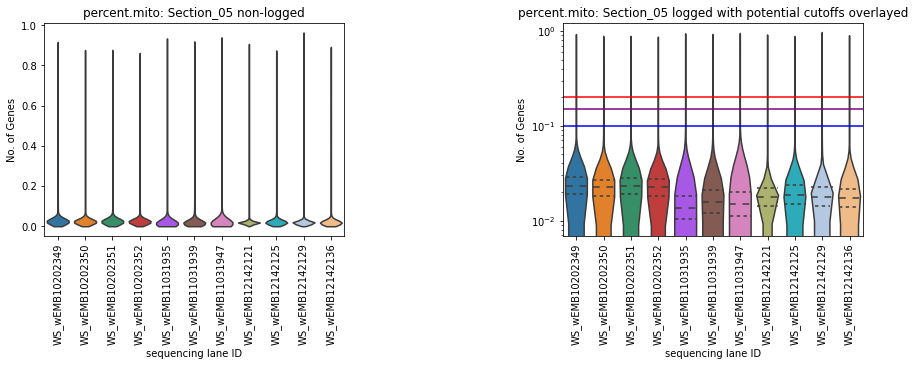

Trying to set attribute `.uns` of view, copying.


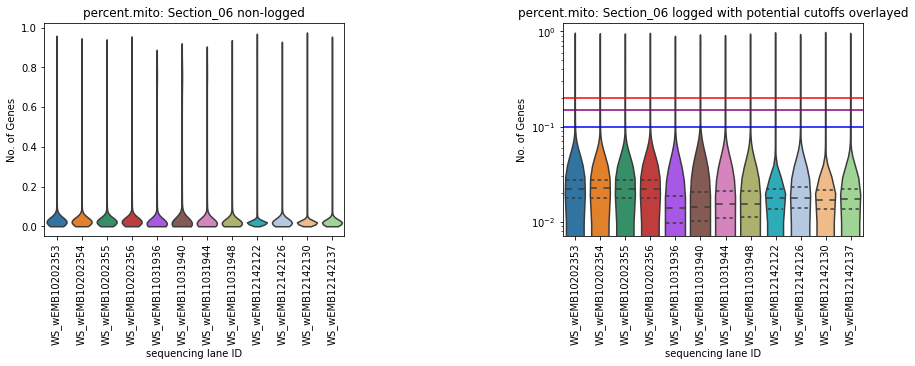

Trying to set attribute `.uns` of view, copying.


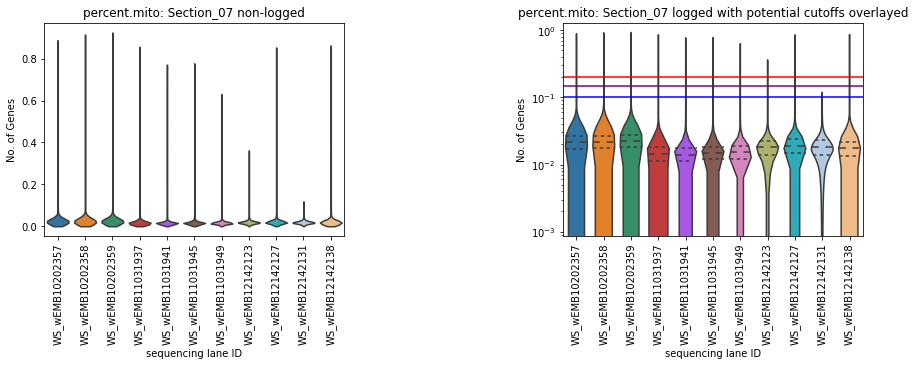

Trying to set attribute `.uns` of view, copying.


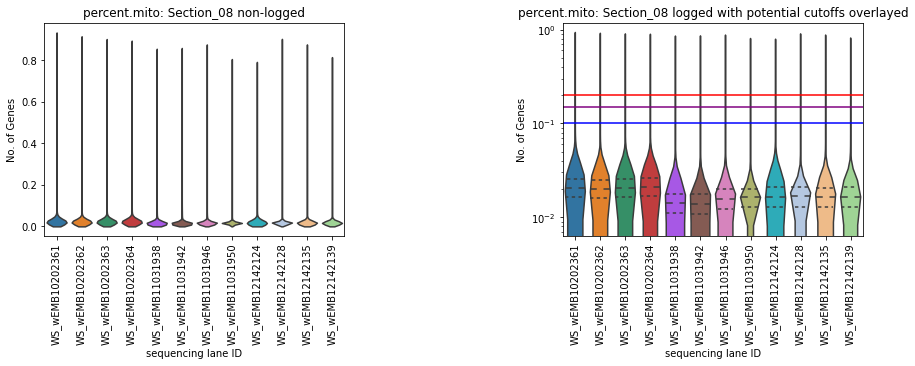

Trying to set attribute `.uns` of view, copying.


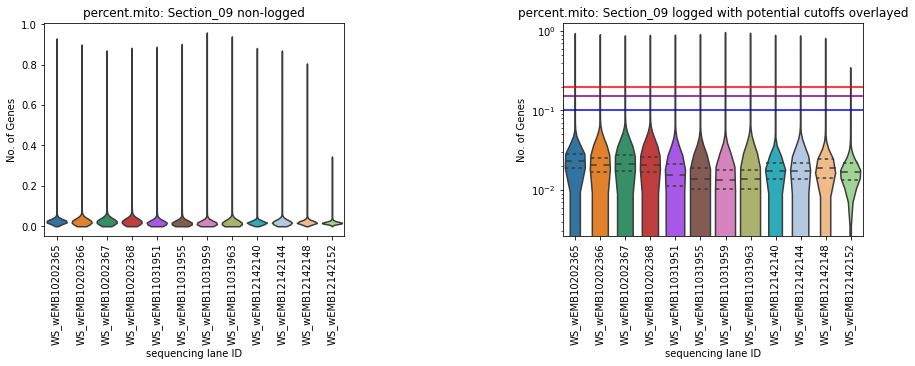

Trying to set attribute `.uns` of view, copying.


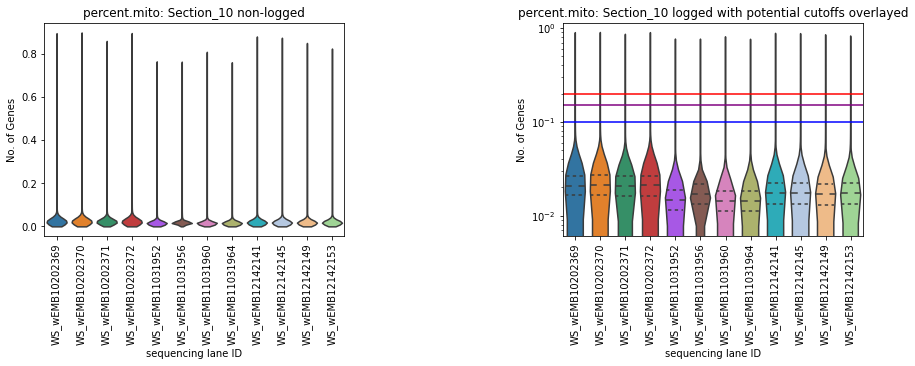

Trying to set attribute `.uns` of view, copying.


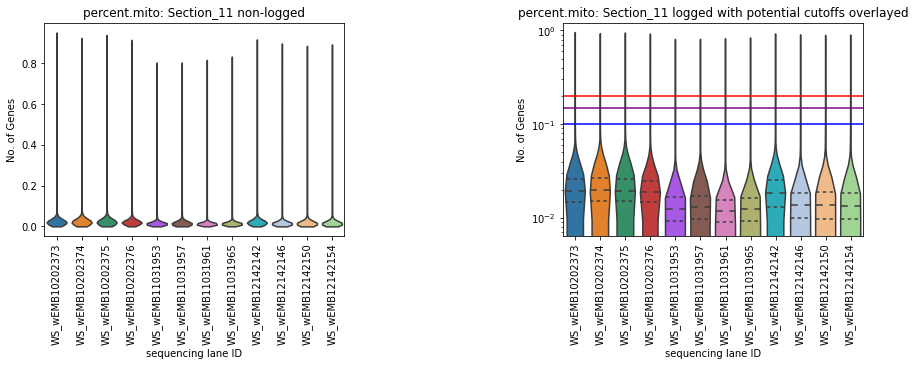

Trying to set attribute `.uns` of view, copying.


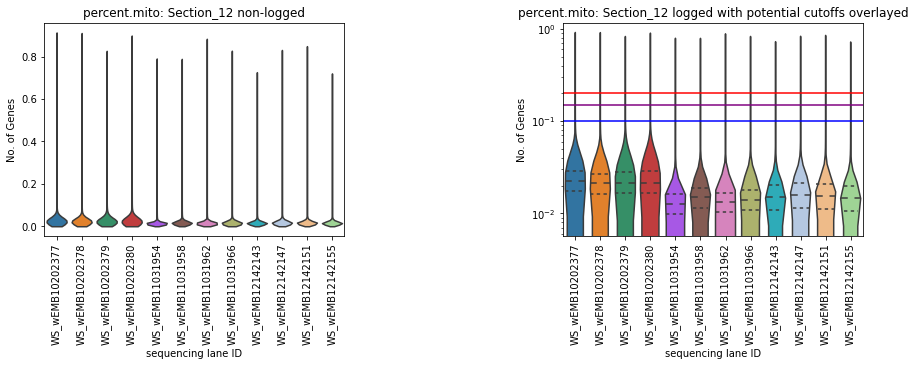

In [25]:
# Per individual lane

# as 103 lanes in total plotting in groups as too many for visualising together

numbers = ['95','96','97','98','99','100','101','102','103','104','105','106']

for n, s in enumerate(adata.obs['spatial_location'].unique()):

    df = adata[adata.obs['spatial_location'].isin([s])]
    print("="*120)
    mpl.rcParams.update(inline_rc)
    
    fig = plt.figure(constrained_layout=True, figsize=(12,5))
    # nGene
    ax1 = plt.subplot(1,2,1)
    sc.pl.violin(df,['percent.mito'], stripplot=False ,log=False, show=False, ax=ax1, groupby='sequencing_lane_ID');
    plt.title('percent.mito: {s} non-logged'.format(s=s))
    plt.ylabel('No. of Genes')
    plt.xticks(rotation=90)
    ax2 = plt.subplot(1,2,2)
    sc.pl.violin(df,['percent.mito'], stripplot=False ,log=True, show=False, inner='quartile', ax=ax2, groupby='sequencing_lane_ID');
    plt.axhline(y = 0.2, color = 'r', linestyle = '-') # default scanpy
    plt.axhline(y = 0.15, color = 'purple', linestyle = '-')
    plt.axhline(y = 0.1, color = 'b', linestyle = '-')
    plt.title('percent.mito: {s} logged with potential cutoffs overlayed'.format(s=s))
    plt.ylabel('No. of Genes')
    plt.xticks(rotation=90)
    
    fig.set_constrained_layout_pads(w_pad=4 / 72, h_pad=4 / 72, hspace=0.2, wspace=0.4)
    plt.show()
    print("="*120)
    del df
    gc.collect()
    fig.savefig(Metadata_out_path+'05_QC_plot_' + numbers[n] + '.pdf', bbox_inches='tight')

In [26]:
# stat cutoffs

category3 = 'percent.mito'

mad3 = adata.obs[category3].mad()
med3 = adata.obs[category3].median()
thresh_up3_1 = med3+(1.4826*mad3)
thresh_up3_2 = med3+(2*mad3)
thresh_up3_3 = med3+(3*mad3)
thresh_down3_1 = med3-(1.4826*mad3)
thresh_down3_2 = med3-(2*mad3)
thresh_down3_3 = med3-(3*mad3)

print("="*60, "\n")
print('\033[1m' + f'Data spread to consider when looking at the category {category3}:'+ '\033[0m', "\n")
print("Note: 0.1 = 10%")
display(adata.obs[[category3]].describe(percentiles=[.05,.1,.25,.5,.75,.9,.95]))
print("")
print(f'Median value                    : {med3}')
print(f'Median value + (MAD * 1.4826)   : {thresh_up3_1}')
print(f'Median value + (MAD * 2)        : {thresh_up3_2}')
print(f'Median value + (MAD * 3)        : {thresh_up3_3}')
print(f'Median value - (MAD * 1.4826)   : {thresh_down3_1}')
print(f'Median value - (MAD * 2)        : {thresh_down3_2}')
print(f'Median value - (MAD * 3)        : {thresh_down3_3}', "\n")
print("="*60, "\n")


Data spread to consider when looking at the category percent.mito: 

Note: 0.1 = 10%


,percent.mito
count,1.183081e+06
mean,3.252831e-02
std,8.940450e-02
min,0.000000e+00
5%,5.990363e-03
10%,8.950816e-03
25%,1.279379e-02
50%,1.744059e-02
75%,2.344336e-02
90%,3.346020e-02



Median value                    : 0.017440592870116234
Median value + (MAD * 1.4826)   : 0.059548537451028824
Median value + (MAD * 2)        : 0.07424343191087246
Median value + (MAD * 3)        : 0.10264485143125057
Median value - (MAD * 1.4826)   : -0.024667351710796356
Median value - (MAD * 2)        : -0.03936224617063999
Median value - (MAD * 3)        : -0.0677636656910181 




### Classical cutoff is to remove cells with greater than 20% for mitochondrial percentage - investigating impact on data using this cutoff
- Look how applying a the set mitochondrial threshold of 20% would affect the following:
    - Whole data
    - Each embryo
    - Each anatomical section
    - Each lane

In [27]:
# Looking at whole data - bare in mind n_gene and n_count cutoff not applied
mito_DF = eu.mito_calc_summary(adata, data_name=['Combined_embryos'], columns=['haniffa_ID','spatial_location'], mito_column = 'percent.mito', mito_cutoff=20)
mito_DF.to_csv(Metadata_out_path+'05_QC_table_01.csv')
mito_DF

,Data,Subset_col,Number_unique_categories,Category_of_interest,Number_cells_before_cutoff,Percent_cuttoff,Number_cells_after_cutoff,Total_number_cells_removed,Percentage_loss
0,Combined_embryos,None,1183081,None,1183081,20,1156614,26467,2.24
0,Combined_embryos,haniffa_ID,3,F137,313958,20,302763,11195,3.57
0,Combined_embryos,haniffa_ID,3,F147,462604,20,455103,7501,1.62
0,Combined_embryos,haniffa_ID,3,F158,406519,20,398748,7771,1.91
0,Combined_embryos,spatial_location,12,Section_01,72649,20,70860,1789,2.46
0,Combined_embryos,spatial_location,12,Section_02,131241,20,126453,4788,3.65
0,Combined_embryos,spatial_location,12,Section_03,117099,20,114894,2205,1.88
0,Combined_embryos,spatial_location,12,Section_04,95946,20,90333,5613,5.85
0,Combined_embryos,spatial_location,12,Section_05,88847,20,87291,1556,1.75
0,Combined_embryos,spatial_location,12,Section_06,95272,20,92193,3079,3.23


In [28]:
# For both embryos individually - bare in mind n_gene and n_count cutoff not applied

E1 = adata[adata.obs['haniffa_ID'].isin(['F137']),:][:]
E2 = adata[adata.obs['haniffa_ID'].isin(['F147']),:][:]
E3 = adata[adata.obs['haniffa_ID'].isin(['F158']),:][:]
mito_DF_1 = eu.mito_calc_summary(E1, data_name=['F137'], columns=['spatial_location'], mito_column = 'percent.mito', mito_cutoff=20, Whole_data = True)
mito_DF_2 = eu.mito_calc_summary(E2, data_name=['F147'], columns=['spatial_location'], mito_column = 'percent.mito', mito_cutoff=20, Whole_data = True)
mito_DF_3 = eu.mito_calc_summary(E3, data_name=['F158'], columns=['spatial_location'], mito_column = 'percent.mito', mito_cutoff=20, Whole_data = True)
mito_DF_indiv = pd.concat([mito_DF_1, mito_DF_2,mito_DF_3], axis=0).reset_index(drop=True)
order = [0,13,26,1,2,3,4,5,6,7,8,9,10,11,12,14,15,16,17,18,19,20,21,22,23,24,25,27,28,29,30,31,32,33,34,35,36,37,38]
mito_DF_indiv = mito_DF_indiv.reindex(order).set_index('Data')
mito_DF_indiv.to_csv(Metadata_out_path+'05_QC_table_02.csv')
mito_DF_indiv

,Subset_col,Number_unique_categories,Category_of_interest,Number_cells_before_cutoff,Percent_cuttoff,Number_cells_after_cutoff,Total_number_cells_removed,Percentage_loss
Data,,,,,,,,
F137,None,313958,None,313958,20,302763,11195,3.57
F147,None,462604,None,462604,20,455103,7501,1.62
F158,None,406519,None,406519,20,398748,7771,1.91
F137,spatial_location,12,Section_01,2068,20,1859,209,10.11
F137,spatial_location,12,Section_02,35421,20,32403,3018,8.52
F137,spatial_location,12,Section_03,39211,20,38707,504,1.29
F137,spatial_location,12,Section_04,28583,20,26300,2283,7.99
F137,spatial_location,12,Section_05,27149,20,26604,545,2.01
F137,spatial_location,12,Section_06,29682,20,28523,1159,3.90


- The classical 20% mitochondiral cutoof looks appropriate for all the data above
- A harsher cutoff of 10% also looks apprpriate for all sections only possibly negatively affecting Section_04 more than other sections 

# Final decision on nGene and nCounts cutoffs for data to remove low quailty cells post cellranger filtered matrices 
### Initial Cutoffs to be applied:
- nGene : 500
- nCounts : 1000

#### To Note: 
#### This is being applied across all three donors at donor resolution not per section or per lane. 
#### Even though per section and per lane information is useful as this is the first pass QC application and cell types are not yet known so better to air on the side of caution.
#### Mitochondrial cutoff to still be applied post annotation +- doublet removal.
#### Doublet removal would be good to look at clusters of doublets not per cell to better account for false positives and false negatives as doublets tend to cluster together

### Reasons for using these cutoffs:
- These cutoffs don't remove too much of the data overall
- Suitable for all individual samples and for samples combined
- Remove similar % of the data overall
- Have a fairly good intersection of cells they would remove from the data

# Apply cutoffs for nGene and nCounts to data

In [29]:
sc.pp.filter_cells(adata, min_genes = 500)
adata = adata[adata.obs['nCounts'] > 1000]

filtered out 31190 cells that have less than 500 genes expressed


# Check number of cells per section after filtering

In [30]:
pd.set_option('display.max_rows', 150)
pd.set_option('display.max_columns', 150)

print('\033[1m' +"Column dtypes:"+ '\033[0m')
display(adata.obs.info())
print("","\n")
print('\033[1m' +"Number of cells grouped by: embryo -> spatial_location -> spatial_location_repliactes:"+ '\033[0m')
adata.obs.groupby(['haniffa_ID','spatial_location','spatial_location_replicates']).apply(len)

Column dtypes:
<class 'anndata._core.views.DataFrameView'>
Index: 1138964 entries, AAACCTGAGATCCGAG-WS_wEMB10202336 to TTTGTCATCCTTCAAT-WS_wEMB12142155
Data columns (total 21 columns):
 #   Column                       Non-Null Count    Dtype   
---  ------                       --------------    -----   
 0   dataset                      1138964 non-null  category
 1   sequencing_lane_ID           1138964 non-null  category
 2   haniffa_ID                   1138964 non-null  category
 3   HDBR_ID                      1138964 non-null  int64   
 4   sequencing_type              1138964 non-null  category
 5   10x_kit                      1138964 non-null  category
 6   spatial_location             1138964 non-null  category
 7   spatial_location_replicates  1138964 non-null  category
 8   sort_ID                      1138964 non-null  category
 9   procedure                    1138964 non-null  category
 10  age_in_cs                    1138964 non-null  int64   
 11  sex              

None

 

Number of cells grouped by: embryo -> spatial_location -> spatial_location_repliactes:


haniffa_ID  spatial_location  spatial_location_replicates
F137        Section_01        Section_01_a                    1831
            Section_02        Section_02_a                    8646
                              Section_02_b                    8651
                              Section_02_c                    8500
                              Section_02_d                    6988
            Section_03        Section_03_a                    9495
                              Section_03_b                   10349
                              Section_03_c                    9338
                              Section_03_d                    9247
            Section_04        Section_04_a                    6192
                              Section_04_b                    5963
                              Section_04_c                    6217
                              Section_04_d                    7662
            Section_05        Section_05_a                    6511
    

# Save anndata objects
- Make a new anndata object which contains raw counts but with low quality cells removed

In [31]:
adata.write_h5ad(Objects_out_path + 'Combined_n_3_raw_counts_low_quailty_cells_removed_' + date + '.h5ad')

***
### Dependencies
Here are some information about resources and import package versions used within this script

In [1]:
%load_ext watermark
%watermark -v -m -p numpy,pandas,scanpy,anndata

Python implementation: CPython
Python version       : 3.9.4
IPython version      : 7.24.1

numpy  : 1.20.3
pandas : 1.2.4
scanpy : 1.7.2
anndata: 0.7.6

Compiler    : GCC 9.3.0
OS          : Linux
Release     : 4.15.0-112-generic
Machine     : x86_64
Processor   : x86_64
CPU cores   : 26
Architecture: 64bit

